# The Practice of QCF

## Analysing impact of media sentiment on Crude oil prices

In [1]:
import numpy as np
import pandas as pd
import tweepy as tw
import datetime
import json
from bs4 import BeautifulSoup
import re
import string
import contractions
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import seaborn as sns
import urllib3
import nltk
from nltk.tokenize import RegexpTokenizer
from copy import deepcopy
import timeit
from nltk.util import ngrams
import operator
from transformers import BertTokenizer
import requests
from dateutil.relativedelta import relativedelta
from functools import reduce
import datanews
import torch.nn.functional as F
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from ibm_watson import NaturalLanguageUnderstandingV1
from ibm_watson.natural_language_understanding_v1 import Features, EntitiesOptions
from ibm_watson.natural_language_understanding_v1 import KeywordsOptions, SentimentOptions, CategoriesOptions
from ibm_cloud_sdk_core.authenticators import IAMAuthenticator
from sklearn.feature_selection import mutual_info_regression

## Setting up the testing dataset (Twitter, Newsapi.org, DataNews.io)

## A) Twitter

### Reading the keys from the txt file

In [2]:
f = open("Required_keys_twitter.txt", "r")
keys = f.read().split('\n')
keys = [l.split('=')[1].strip() for l in keys]
f.close()

### Setting up the keys

In [3]:
# Keys
API_key, API_secret_key, access_token, access_secret_token = tuple(keys)

### Setting up the twitter api

In [4]:
auth = tw.OAuthHandler(API_key, API_secret_key)
auth.set_access_token(access_token, access_secret_token)
api = tw.API(auth, wait_on_rate_limit=True)

### Twitter handles from which tweets will be pulled

In [5]:
username = ['OilandEnergy', 'CrudeOilPrices', 'PlattsOil', 'BloombergNRG', 'WorldOil', 'OPECnews', 
            'OPECSecretariat', 'FPRI', 'ReutersCommods', 'ETCommodities', 'IEA', 'EIAgov', 
            'ftenergy', 'BNCommodities', 'OGJOnline', 'Rigzone', 'energyintel']

### Dates (Start, End)

In [6]:
startDate = datetime.datetime(2019, 9, 1, 0, 0, 0)
endDate =   datetime.datetime(2020, 11, 1, 0, 0, 0)

### Pulling tweets

In [ ]:
tweets = {}
for user in username:
    print('\nFetching tweets from handle -@', user,'\n', sep = '')
    usertweets = []
    tmpTweets = api.user_timeline(user, count = 200, exclude_replies = True)
    for tweet in tmpTweets:
        if tweet.created_at < endDate and tweet.created_at > startDate:
            json_str = json.dumps(tweet._json)
            parsed = json.loads(json_str) 
            usertweets.append(parsed)
    
    try:
        while (tmpTweets[-1].created_at > startDate):
            print("Last Tweet @", tmpTweets[-1].created_at, " - fetching some more")
            tmpTweets = api.user_timeline(user, max_id = tmpTweets[-1].id, exclude_replies = True)
            for tweet in tmpTweets:
                if tweet.created_at < endDate and tweet.created_at > startDate:
                    json_str = json.dumps(tweet._json)
                    parsed = json.loads(json_str) 
                    usertweets.append(parsed)
    except IndexError:
        tweets[user] = usertweets
        continue
    
    tweets[user] = usertweets

In [ ]:
tweets_df = pd.DataFrame()
for user in username:
    usertweets_df = pd.DataFrame(tweets[user])
    usertweets_df['Tw_handle'] = user
    usertweets_df = usertweets_df[['Tw_handle', 'created_at', 'text']]
    tweets_df = pd.concat([tweets_df, usertweets_df])
tweets_df.reset_index(drop=True, inplace = True)

In [7]:
#tweets_df.to_csv('fetched_tweets.csv', index = False)
tweets_df = pd.read_csv('fetched_tweets_v2.csv')
tweets_df.drop_duplicates(inplace = True)
tweets_df.reset_index(drop=True, inplace = True)

### Extracting relevant tweets from the tweets_df dataframe...

In [8]:
stp_wrds = set(STOPWORDS)
tweets_df['text_mod'] = [re.sub(r"http\S+", "", txt_data) for txt_data in tweets_df['text']]   # Removing urls from tweets
tweets_df['text_mod'] = [contractions.fix(txt_data) for txt_data in tweets_df['text_mod']]         # Fixing contractions
tweets_df['text_mod'] = [txt_data.translate(dict((ord(char), None) for char in string.punctuation)) for txt_data in tweets_df['text_mod']] # Removing punctuation
tweets_df['text_mod'] = [txt_data.translate(str.maketrans('', '', string.digits)) for txt_data in tweets_df['text_mod']]  # Removing Numbers

tokenizer = RegexpTokenizer('[a-zA-Z0-9@]+')

tweets_df['text_tokened'] = [tokenizer.tokenize(tweets_df['text_mod'][i]) for i in range(tweets_df.shape[0])]               # Tokenizing
tweets_df['text_tokened'] = [[word for word in tweets_df['text_tokened'][i] if not word in stp_wrds] for i in range(tweets_df.shape[0])]   # Removing stop words

In [9]:
rel_words = ['Oil', 'oil', 'COVID', 'OPEC', 'coronavirus', 'Coronavirus', 'crude', 'deal', 'Shell', 'Commodities', 
             'Commodity', 'commodity', 'commodities', 'shell', 'ExxonMobil', 'exxon', 'exxonmobil', 'WTI', 'deals', 
             'deal', 'election', 'Chevron', 'chevron', 'refinery', 'Halliburton', 'halliburton', 'Biden', 'biden', 'Trump',
            'trump', 'Energy', 'energy', 'offshore', 'BP', 'Petroleum', 'Petrol', 'petrol', 'gas', 'Gas', 'prices', 'price'
            , 'sanctions', 'pandemic', 'pipeline', 'gasoline', 'Saudi', 'fuel', 'LNG', 'lng', 'crudeoil', 'Crudeoil', 
             'CrudeOil', 'Gasoline', 'refineries', 'OIL', 'OPECs', 'Middle',  'trading', 'TRADING', 'COMMODITY',
            'production', 'soybean', 'Russia', 'diesel', 'fuels', 'fossil', 'fossilfuel', 'fossilfuels', 'Fossil', 
             'oilfield', 'Schlumberger', 'barrels', 'onshore', 'Exxon', 'Oils', 'oils', 'Covid', 'covid', 'Gazprom', 
             'drilling', 'wells', 'drillers', 'Pipeline', 'refiners', 'rig', 'Crude', 'futures', 'oilprices', 'slowdown'
            'CORONAVIRUS']
status_vals = []
start = timeit.default_timer()
for i in range(tweets_df.shape[0]):
    status_vals.append(any(word in rel_words for word in tweets_df['text_tokened'][i]))
stop = timeit.default_timer()
print("Program Executed in "+str((stop - start))+' sec')

tweets_df['Status'] = status_vals
tweets_df = tweets_df[tweets_df['Status'] == True]
tweets_df = tweets_df[['Tw_handle', 'created_at', 'text']]

Program Executed in 2.9852758999999978 sec


In [10]:
tweets_df.shape

(24392, 3)

In [11]:
tweets_df.head()

,Tw_handle,created_at,text
0,OilandEnergy,Fri Oct 30 21:30:05 +0000 2020,The giant Johan Sverdrup oilfield in Norway’s ...
1,OilandEnergy,Fri Oct 30 21:22:55 +0000 2020,Oil prices have hit a 5-month low as COVID cas...
2,OilandEnergy,Fri Oct 30 18:15:04 +0000 2020,In another sign that the second coronavirus wa...
3,OilandEnergy,Fri Oct 30 18:09:19 +0000 2020,Baker Hughes reported on Friday that the numbe...
4,OilandEnergy,Fri Oct 30 16:01:21 +0000 2020,The United States has sold crude oil seized fr...


## B) Newsapi.org

### Reading the keys from the txt file

In [12]:
# Retrieving the NewsAPI keys
f = open("Required_keys_NewsAPI.txt", "r")
NewsAPI_keys = f.read().split('\n')
NewsAPI_keys = [l.split('=')[1].strip() for l in NewsAPI_keys]
f.close()

### Setting up the sources

In [13]:
relevant_sources = ['abc-news', 'abc-news-au', 'al-jazeera-english', 'australian-financial-review', 'bbc-news',
 'bloomberg', 'business-insider', 'cbc-news', 'cbs-news', 'cnn', 'crypto-coins-news', 'financial-post', 'fox-news', 
 'google-news', 'google-news-uk', 'independent', 'msnbc', 'nbc-news', 'newsweek', 'politico', 'reddit-r-all', 'reuters',
 'the-hill',  'the-huffington-post', 'the-times-of-india', 'the-wall-street-journal', 'the-washington-post',
 'the-washington-times', 'time', 'usa-today']

sources = requests.get('https://newsapi.org/v2/sources?language=en&apiKey=' + NewsAPI_keys[0]).json()
sources = [s['id'] for s in sources['sources'] if s['id'] in relevant_sources]

### Setting up the dates

In [14]:
startDate = datetime.date.today()
lastDate =   startDate + relativedelta(months=-1)  # Because there is a restriction that I can only go 1 month back in time

### Retrieving the news articles

In [ ]:
'''Pulling from the sources'''
all_responses = []
for src in sources:
    url = ('http://newsapi.org/v2/everything?'
           'q=Oil-prices'
           '&sources='+src+'&'
           'from='+str(startDate)+'&to='+str(lastDate)+'&'
           'sortBy=popularity&'
           'language=en&'
           'pageSize=100&'
           'apiKey='+NewsAPI_keys[0])
    
    response = requests.get(url).json()
    all_responses.append(response)

In [ ]:
# Extracting the relevant data
dts_newsapi = [[all_responses[i]['articles'][j]['publishedAt'][:10] for j in range(len(all_responses[i]['articles']))] 
                   if len(all_responses[i]['articles']) != 0 else None for i in range(len(all_responses))]
dts_newsapi = reduce(operator.concat, [x for x in dts_newsapi if x is not None])

sent_newsapi = [[all_responses[i]['articles'][j]['description'] for j in range(len(all_responses[i]['articles']))] 
                   if len(all_responses[i]['articles']) != 0 else None for i in range(len(all_responses))]
sent_newsapi = reduce(operator.concat, [x for x in sent_newsapi if x is not None])

source_newsapi = [[all_responses[i]['articles'][j]['source']['name'] for j in range(len(all_responses[i]['articles']))] 
                   if len(all_responses[i]['articles']) != 0 else None for i in range(len(all_responses))]
source_newsapi = reduce(operator.concat, [x for x in source_newsapi if x is not None])

Newsapi_df = pd.DataFrame()
Newsapi_df['Date'] = pd.to_datetime(dts_newsapi, format='%Y-%m-%d')
Newsapi_df['Sentence'] = sent_newsapi
Newsapi_df['Source'] = source_newsapi
Newsapi_df['Source'] = 'Newsapi.org - ' + Newsapi_df['Source']
Newsapi_df.sort_values(by='Date', inplace = True)
Newsapi_df.reset_index(drop=True, inplace = True)

In [15]:
#Newsapi_df.to_csv('fetched_newsapi.csv', index = False)
Newsapi_df = pd.read_csv('fetched_newsapi.csv')

In [16]:
Newsapi_df.shape

(620, 3)

In [17]:
Newsapi_df.head()

,Date,Sentence,Source
0,2020-10-01,"<p>Whether you’re going veggie for health, eth...",Newsapi.org - Independent
1,2020-10-01,Exxon Mobil Corp <XOM.N> said on Thursday its ...,Newsapi.org - Reuters
2,2020-10-01,Malaysian palm oil futures rose 2.8% on Thursd...,Newsapi.org - Reuters
3,2020-10-01,Crude oil and natural gas are in enduring bear...,Newsapi.org - Bloomberg
4,2020-10-01,With the nation roiled by the pandemic and pro...,Newsapi.org - Independent


## C) DataNews.io

### Reading the keys from the txt file

In [18]:
# Retrieving the Datanews.io keys
f = open("Required_keys_DataNews.io.txt", "r")
DataNews_io_keys = f.read().split('\n')
DataNews_io_keys = [l.split('=')[1].strip() for l in DataNews_io_keys]
f.close()

### Setting up the dates

In [19]:
startDate = datetime.date(2019, 9, 1)
endDate =   datetime.date(2020, 11, 1)

### Setting up the sources

In [20]:
# Setting up the url for pulling the data and then retrieving the sources
url = ('http://api.datanews.io/v1/news?'
       'q=Oil-prices&'
       'from='+str(startDate)+'&to='+str(endDate)+'&'
       'country=us&'
       'language=en&'
       'size=100&'
       'apiKey='+DataNews_io_keys[0])

response = requests.get(url).json()
dtnews_sources = list(set([x['source'] for x in response['hits']]))

In [21]:
dtnews_sources

['brecorder.com',
 'rttnews.com',
 'cnbctv18.com',
 'foxbusiness.com',
 'etftrends.com',
 'washingtonpost.com',
 'ibtimes.com.au',
 'chron.com',
 'ca.finance.yahoo.com',
 'oilfieldtechnology.com',
 'streetinsider.com',
 'mysanantonio.com',
 'oilprice.com',
 'businessinsider.com',
 'dailyfx.com',
 'malaysiasun.com',
 'breitbart.com',
 'cnn.com',
 'rt.com',
 'rawstory.com',
 'upi.com',
 'wsj.com',
 'investingcube.com',
 'cnbc.com',
 'forbes.com',
 'ccn.com',
 'worldoil.com',
 'us.cnn.com',
 'marketpulse.com',
 'ca.reuters.com',
 'uk.reuters.com',
 'forextv.com',
 'ibtimes.com',
 'theunionjournal.com',
 'globenewswire.com',
 'theeagleonline.com.ng',
 'moneycontrol.com',
 'in.reuters.com',
 'oilandgas360.com',
 'reuters.com',
 'proshareng.com']

### Retrieving the news articles

In [ ]:
'''Pulling from the sources'''
all_responses_dtnews = []
for src in dtnews_sources:
    url = ('http://api.datanews.io/v1/news?'
           'q=Oil-prices&'
           '&source='+src+'&'
           'from='+str(startDate)+'&to='+str(endDate)+'&'
           'country=us&'
           'language=en&'
           'size=100&'
           'apiKey='+DataNews_io_keys[0])

    response = requests.get(url).json()
    all_responses_dtnews.append(response)

In [ ]:
test = []
for x in all_responses_dtnews:
    if 'hits' in list(x.keys()):
        test.append(True)
    else:
        test.append(False)

all_responses_dtnews_v2 = []
for x,y in zip(test, all_responses_dtnews):
    if x == True:
        all_responses_dtnews_v2.append(y)

In [ ]:
# Extracting the relevant data
dts_datanewsio = [[all_responses_dtnews_v2[i]['hits'][j]['pubDate'][:10] for j in range(len(all_responses_dtnews_v2[i]['hits']))] 
                   if len(all_responses_dtnews_v2[i]['hits']) != 0 else None for i in range(len(all_responses_dtnews_v2))]
dts_datanewsio = reduce(operator.concat, [x for x in dts_datanewsio if x is not None])

sent_datanewsio = [[all_responses_dtnews_v2[i]['hits'][j]['title'] for j in range(len(all_responses_dtnews_v2[i]['hits']))] 
                   if len(all_responses_dtnews_v2[i]['hits']) != 0 else None for i in range(len(all_responses_dtnews_v2))]
sent_datanewsio = reduce(operator.concat, [x for x in sent_datanewsio if x is not None])

source_datanewsio = [[all_responses_dtnews_v2[i]['hits'][j]['source'] for j in range(len(all_responses_dtnews_v2[i]['hits']))] 
                   if len(all_responses_dtnews_v2[i]['hits']) != 0 else None for i in range(len(all_responses_dtnews_v2))]
source_datanewsio = reduce(operator.concat, [x for x in source_datanewsio if x is not None])

Datanewsio_df = pd.DataFrame()
Datanewsio_df['Date'] = pd.to_datetime(dts_datanewsio, format='%Y-%m-%d')
Datanewsio_df['Sentence'] = sent_datanewsio
Datanewsio_df['Source'] = source_datanewsio
Datanewsio_df['Source'] = 'DataNews.io - ' + Datanewsio_df['Source']
Datanewsio_df.sort_values(by='Date', inplace = True)
Datanewsio_df.reset_index(drop=True, inplace = True)

In [22]:
#Datanewsio_df.to_csv('fetched_datanewsio_v3.csv', index = False)
#Datanewsio_df_old = pd.read_csv('fetched_datanewsio_v2.csv')
Datanewsio_df = pd.read_csv('fetched_datanewsio_v3.csv')
#Datanewsio_df = pd.concat([Datanewsio_df, Datanewsio_df_old])
#Datanewsio_df.drop_duplicates(inplace = True)
#Datanewsio_df.reset_index(drop=True, inplace = True)
#Datanewsio_df.to_csv('fetched_datanewsio_v3.csv', index = False)

In [23]:
Datanewsio_df.shape

(2381, 3)

In [24]:
Datanewsio_df.head()

,Date,Sentence,Source
0,2019-09-01,Will Bitcoin's Looming Halving Ignite a Recove...,DataNews.io - ccn.com
1,2019-09-02,"Dow Futures Bleed on Labor Day, Extending Augu...",DataNews.io - ccn.com
2,2019-09-03,"Bitcoin Price Breaks $10,000, Supercharged by ...",DataNews.io - ccn.com
3,2019-09-04,"10-Year Treasury Bond Yield Will Crash to 1%, ...",DataNews.io - ccn.com
4,2019-09-05,"The US Housing Market Could Crash, Warns Nobel...",DataNews.io - ccn.com


### Descriptive stats of the testing dataset (just twitter)

### (a) Length of the dataset -:

In [25]:
print(tweets_df.shape[0])

24392


### (b) Number of tweets from each source -:

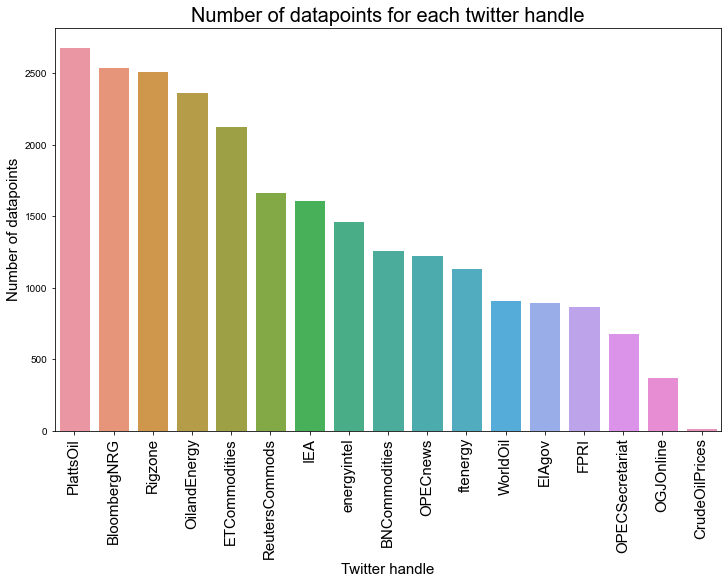

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(10,8))
sns.set_style('whitegrid')
sns.barplot(x = list(tweets_df.Tw_handle.value_counts().to_dict().keys()), y = list(tweets_df.Tw_handle.value_counts().to_dict().values()), ax = ax)
ax.set_xlabel('Twitter handle', size = 15)
ax.set_ylabel('Number of datapoints', size = 15)
ax.set_xticklabels(list(tweets_df.Tw_handle.value_counts().keys()), rotation = 90, size = 15)
plt.title('Number of datapoints for each twitter handle', size = 20)
fig.savefig('Dtpoints_testing.png')
plt.show()

### (c) Boxplot of length of tweets from each handle -:

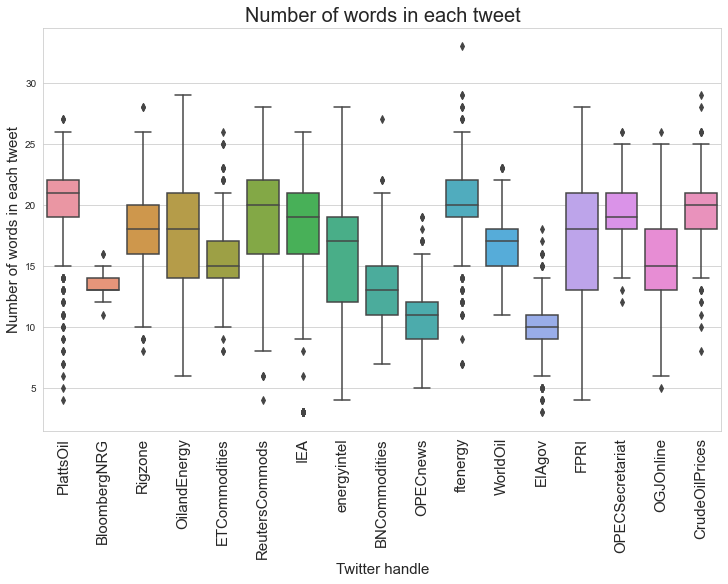

In [27]:
tweets_df['wrds_in_tweet'] = [len(txt.split(' ')) for txt in tweets_df['text']]
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(10,8))
sns.set_style('whitegrid')
sns.boxplot(x = tweets_df['Tw_handle'], y = tweets_df['wrds_in_tweet'], ax = ax)
ax.set_xlabel('Twitter handle', size = 15)
ax.set_ylabel('Number of words in each tweet', size = 15)
ax.set_xticklabels(list(tweets_df.Tw_handle.value_counts().keys()), rotation = 90, size = 15)
ax.set_title('Number of words in each tweet', size = 20)
fig.savefig('wordsent_testing.png')
plt.show()

### (d) Generating Wordcloud for each twitter handle -:

In [28]:
Wordcloud_txt = {}
for user in username:
    txt_data = '. '.join(tweets_df[tweets_df['Tw_handle'] == user]['text'])
    
    soup = BeautifulSoup(txt_data)                                                           # Removing HTML tags if any
    txt_data = soup.get_text()
    
    txt_data =  re.sub(r"http\S+", "", txt_data)                                             # Removing urls from tweets
    
    txt_data = txt_data.translate(dict((ord(char), None) for char in string.punctuation))    # Removing punctuation
    
    txt_data = txt_data.translate(str.maketrans('', '', string.digits))                      # Removing Numbers
    
    txt_data = contractions.fix(txt_data)                                                    # Fixing contractions
    
    txt_data = txt_data.replace('\n', '').replace('\r', '')                                  # Removing \n and \r
    
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030""]+", re.UNICODE)
    txt_data = emoji_pattern.sub(r'', txt_data)
    txt_data = re.sub(r"will", "", txt_data)                                                 # Removing 'will'
    
    Wordcloud_txt[user] = txt_data

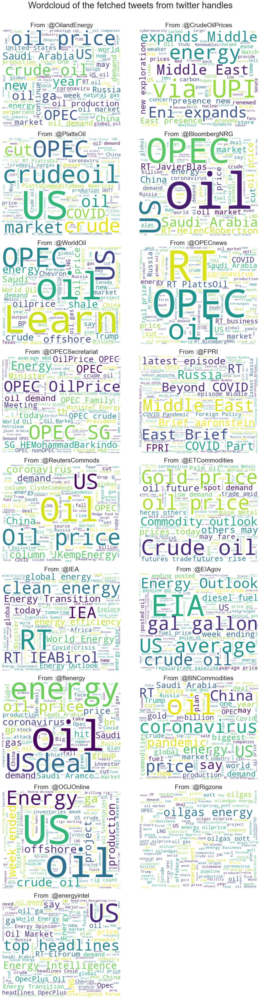

In [29]:
req_rows = int(len(username)/2) if len(username)%2==0 else int(len(username)/2) + 1
fig, axs = plt.subplots(nrows=req_rows, ncols=2, figsize = (15,55), constrained_layout = True)
i = 0
index = 0
while i < len(username):
    j=0
    while j < 2:
        wc = WordCloud(width=400, height=330, max_words=150, background_color="white", stopwords = stp_wrds).generate(Wordcloud_txt[username[i]])
        axs[index,j].imshow(wc, interpolation='bilinear')
        axs[index,j].axis("off")
        axs[index,j].set_title('From :@'+str(username[i]), size = 25)
        j = j + 1
        i = i + 1
        if (i == len(username)) & (j != 2):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Wordcloud of the fetched tweets from twitter handles\n', size = 35)
fig.savefig('Wordcloud_testing.png')
plt.show()

## Setting up the training dataset

### Loading the Financial phrase bank data

In [30]:
# Reading the dataset
f = open("./Datasets/FinancialPhraseBank-v1.0/FinancialPhraseBank-v1.0/Sentences_50Agree.txt", "r")
lines = f.read().split('\n')
lines = [l.split('@') for l in lines]
f.close()

# Creating a dataframe
Train_set = pd.DataFrame(lines)
Train_set.rename(columns={0:"Sentence", 1:"Sentiment_score"}, inplace = True)
Train_set['Sentiment_score'].replace({'neutral':0, 'positive':1, 'negative':-1}, inplace=True)
Train_set.dropna(inplace = True)

### Financial phrasebank dataframe (Visualisation)

In [31]:
#Train_set.head()
Train_set[['Sentence', 'Sentiment_score']][:5]

,Sentence,Sentiment_score
0,"According to Gran , the company has no plans t...",0.0
1,Technopolis plans to develop in stages an area...,0.0
2,The international electronic industry company ...,-1.0
3,With the new production plant the company woul...,1.0
4,According to the company 's updated strategy f...,1.0



### Loading the FiQA dataset

In [32]:
# replace > with greater than

# Headlines
f = open('./Datasets/FiQA_ABSA_task1/task1_headline_ABSA_train.json', "r", encoding='utf-8')
FiQA_headlines = json.loads(f.read())
FiQA_headlines = {v['sentence']:float(v['info'][0]['sentiment_score']) for k,v in FiQA_headlines.items()}
f.close()

# Posts
f = open('./Datasets/FiQA_ABSA_task1/task1_post_ABSA_train.json', "r", encoding='utf-8')
FiQA_posts = json.loads(f.read())
FiQA_posts = {v['sentence']:float(v['info'][0]['sentiment_score']) for k,v in FiQA_posts.items()}
f.close()

# Merging the two dictionaries
FiQA_headlines.update(FiQA_posts)

# Creating a dataframe
FiQA_dtset = pd.DataFrame([[k,v] for k,v in FiQA_headlines.items()])
FiQA_dtset.rename(columns={0:"Sentence", 1:"Sentiment_score"}, inplace = True)
FiQA_dtset['Sentiment_score'] = [1 if x>0.2 else (-1 if x<-0.2 else 0) for x in FiQA_dtset['Sentiment_score']]

# Merging this with financial phrasebank
Train_set = pd.concat([Train_set, FiQA_dtset])
Train_set.reset_index(drop=True, inplace = True)
Train_set.dropna(inplace = True)

### FiQA dataset dataframe (Visualisation)

In [33]:
FiQA_dtset.head()

,Sentence,Sentiment_score
0,Royal Mail chairman Donald Brydon set to step ...,-1
1,Stakes High for AstraZeneca Heart Drug Facing ...,-1
2,UPDATE 1-Dairy Crest loses a third of Morrison...,0
3,Insight hires Aviva's David Hillier for multi-...,0
4,Primark racks up a happy Christmas after stron...,1


### Loading the Stanford's Sentiment140 dataset

In [34]:
sent140_dtset = pd.read_csv('./Datasets/trainingandtestdata/training.1600000.processed.noemoticon.csv', header = None, encoding = 'latin-1', 
                            names = ['Sentiment_score', 'id', 'date', 'query', 'user', 'text'])
sent140_dtset['Sentiment_score'].replace({0:-1, 2:0, 4:1}, inplace = True)
sent140_dtset.drop(columns=['date', 'query', 'user'], inplace = True)

### Stanford's Sentiment140 dataset dataframe (Visualisation)

In [35]:
sent140_dtset.head()

,Sentiment_score,id,text
0,-1,1467810369,"@switchfoot http://twitpic.com/2y1zl - Awww, t..."
1,-1,1467810672,is upset that he can't update his Facebook by ...
2,-1,1467810917,@Kenichan I dived many times for the ball. Man...
3,-1,1467811184,my whole body feels itchy and like its on fire
4,-1,1467811193,"@nationwideclass no, it's not behaving at all...."


### Extracting finance related keywords for extracting relevant tweets from Stanford's Sentiment140 dataset.

In [36]:
http = urllib3.PoolManager()
response = http.request('GET', 'http://home.ubalt.edu/ntsbarsh/stat-data/keysphrasfinance.htm')
soup = BeautifulSoup(response.data,'html.parser')
Fin_keywords = list(set([str(s.string)[:-1] for s in soup.find_all('b')[3:]]))
Fin_keywords.remove('Non')

In [37]:
# Adding some more
Oil_wrds = ['#Oil', '#Oilprices', '#OilPrices', 'oil prices', 'oil', 'Oil', 'Oil Prices']
Fin_keywords = Fin_keywords + Oil_wrds

In [38]:
# Stock tickers
nsdq_tickers = list('$' + pd.read_csv('./Datasets/companylist.csv')['Symbol'])
nsdq_tickers = nsdq_tickers + list('#' + pd.read_csv('./Datasets/companylist.csv')['Symbol'])
Fin_keywords = Fin_keywords + nsdq_tickers

### Extracting relevant tweets

In [ ]:
sent140_dtfilt = deepcopy(sent140_dtset)
sent140_dtfilt['text_mod'] = [re.sub(r"http\S+", "", txt_data) for txt_data in sent140_dtfilt['text']]   # Removing urls from tweets
sent140_dtfilt['text_mod'] = [contractions.fix(txt_data) for txt_data in sent140_dtfilt['text_mod']]         # Fixing contractions
sent140_dtfilt['text_mod'] = [txt_data.translate(dict((ord(char), None) for char in string.punctuation)) for txt_data in sent140_dtfilt['text_mod']] # Removing punctuation
sent140_dtfilt['text_mod'] = [txt_data.translate(str.maketrans('', '', string.digits)) for txt_data in sent140_dtfilt['text_mod']]  # Removing Numbers

tokenizer = RegexpTokenizer('[a-zA-Z0-9@]+')

sent140_dtfilt['text_tokened'] = [tokenizer.tokenize(sent140_dtfilt['text_mod'][i]) for i in range(sent140_dtfilt.shape[0])]               # Tokenizing
sent140_dtfilt['text_tokened'] = [[word for word in sent140_dtfilt['text_tokened'][i] if not word in stp_wrds] for i in range(sent140_dtfilt.shape[0])]   # Removing stop words

In [ ]:
status_vals = []
start = timeit.default_timer()
for i in range(sent140_dtfilt.shape[0]):
    #print(i)
    status_vals.append(any(word in Fin_keywords for word in sent140_dtfilt['text_tokened'][i]))
stop = timeit.default_timer()
print("Program Executed in "+str((stop - start)/60)+'min')

In [ ]:
sent140_dtfilt['Status'] = status_vals

In [ ]:
filtDT_set = deepcopy(sent140_dtfilt[sent140_dtfilt['Status']==True][['text','Sentiment_score']])
filtDT_set.reset_index(drop = True, inplace = True)
filtDT_set.rename(columns={'text':'Sentence'}, inplace = True)

# Concatenating Training set with that of stanford's sentiment160 filtered dataset.
Train_set_sent160 = pd.concat([Train_set, filtDT_set])
Train_set_sent160.reset_index(drop = True, inplace = True)
Train_set_sent160.dropna(inplace = True)

### Stanford's filtered Sentiment140 dataset dataframe (Visualisation)

In [ ]:
filtDT_set.head()

### Plan is to train the model on two datasets, one including sentiment160 filtered dataset along with Financial phrasebank and FiQA dataset and one with just the combined Financial phrasebank and FiQA dataset.

### $Mid \ term \ presentation \ requirements$

The presentation should include -:

(1) a description of the problem \
(2) literature review (academic or practitioner) \
(3) review of the methodology \
(4) data sources \
(5) descriptive stats of the data \
(6) prelimianry analysis \
(7) challenges faced or expected \
(8) lessons learnt so far \
(9) next steps planned in the anlaysis 

You also need to upload the mid-term presentation with all these details by October 22nd (all grpups)

### Descriptive stats of the data -: 

### (i) Train set (excluding filtered Sentiment160 datasset)

### (a) Length of the dataset -:

In [39]:
print(Train_set.shape[0])

5957


### (b) No. of datapoints for each polarity score -:

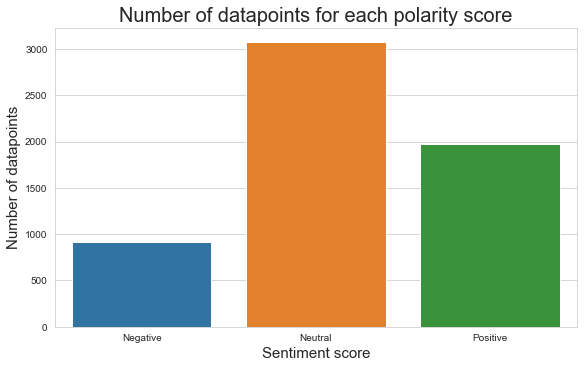

In [40]:
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(8,5))
sns.set_style('whitegrid')
sns.barplot(x = sorted(list(set(Train_set['Sentiment_score']))), y = list(Train_set.groupby(['Sentiment_score']).size()), ax = ax)
ax.set_xlabel('Sentiment score', size = 15)
ax.set_ylabel('Number of datapoints', size = 15)
plt.title('Number of datapoints for each polarity score', size = 20)
ax.set_xticklabels(('Negative', 'Neutral', 'Positive'))
fig.savefig('Dtpoints_polscore_exclSentiment140.png')
plt.show()

### (c) Number of words in each sentence/tweet -:

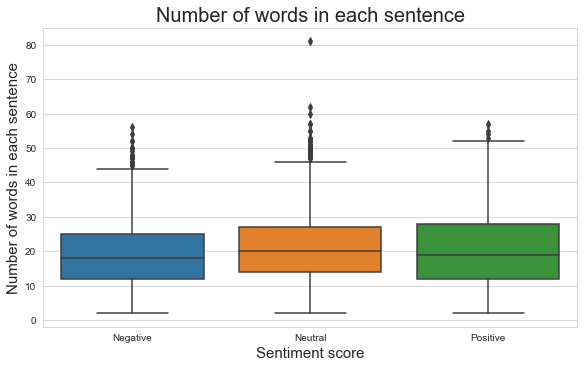

In [41]:
Train_set['wrds_in_sent'] = [len(txt.split(' ')) for txt in Train_set['Sentence']]
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(8,5))
sns.set_style('whitegrid')
sns.boxplot(x = Train_set['Sentiment_score'], y = Train_set['wrds_in_sent'], ax = ax)
ax.set_xlabel('Sentiment score', size = 15)
ax.set_ylabel('Number of words in each sentence', size = 15)
plt.title('Number of words in each sentence', size = 20)
ax.set_xticklabels(('Negative', 'Neutral', 'Positive'))
fig.savefig('wordsent_polscore_exclSentiment140.png')
plt.show()

### Preprocessing the dataset for unigram, bigram, trigram and wordcloud generation

In [42]:
Train_set['Sent_mod'] = [re.sub(r"http\S+", "", txt_data) for txt_data in Train_set['Sentence']]   # Removing urls from tweets
Train_set['Sent_mod'] = [contractions.fix(txt_data) for txt_data in Train_set['Sent_mod']]         # Fixing contractions
Train_set['Sent_mod'] = [txt_data.translate(dict((ord(char), None) for char in string.punctuation)) for txt_data in Train_set['Sent_mod']] # Removing punctuation

# Taking care of >, < , =, & signs
Train_set['Sent_mod'] = [re.sub(r"<3", "love", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"&gt;", ">", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"&lt;", "<", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"&amp;", "&", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r">", "greater than", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"<", "less than", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"=", "is equal to", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"&", "and", txt_data) for txt_data in Train_set['Sent_mod']]

# Taking care of the slangs
Train_set['Sent_mod'] = [re.sub(r"w/e", "whatever", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"w/", "with", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"lmao", "laughing my ass off", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"rofl", "rolling on the floor laughing", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"roflmao", "rolling on the floor laughing my ass off", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"recentlu", "recently", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"exp0sed", "exposed", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"amirite", "am I right", txt_data) for txt_data in Train_set['Sent_mod']]
Train_set['Sent_mod'] = [re.sub(r"USAgov", "USA government", txt_data) for txt_data in Train_set['Sent_mod']]

Train_set['Sent_mod'] = [txt_data.translate(str.maketrans('', '', string.digits)) for txt_data in Train_set['Sent_mod']]  # Removing Numbers

In [43]:
Train_setproc = pd.DataFrame()
Train_setproc['Sent_mod'] = Train_set.groupby('Sentiment_score')['Sent_mod'].apply(lambda x: ' '.join(x))
Train_setproc['Sentiment_score'] = [-1, 0, 1]
Train_setproc.reset_index(drop = True, inplace = True)
Train_setproc['Sent_toknd'] = Train_setproc['Sent_mod'].apply(lambda x: nltk.word_tokenize(x))
Train_setproc['Sent_toknd'] = [[word for word in x if not word in stp_wrds] for x in Train_setproc['Sent_toknd']]

# Replacing some more words
other_wrds = ['s', 'x', 'q', 'm', 'A', 'The', 'In', 'I', 'X', 'At', 'As', 'E', 'B', 'AS', 'We', 'To', 'us', 'G', 'With', 'will', 'It']
Train_setproc['Sent_toknd'] = [['million' if ((word == 'mn') or (word == 'mln')) else word for word in x] for x in Train_setproc['Sent_toknd']]
Train_setproc['Sent_toknd'] = [['percent' if word == 'pct' else word for word in x] for x in Train_setproc['Sent_toknd']]
Train_setproc['Sent_toknd'] = [['billion' if word == 'bn' else word for word in x] for x in Train_setproc['Sent_toknd']]
Train_setproc['Sent_toknd'] = [['EUR' if ((word == 'eur') or (word == 'euro') or (word == 'EURm')) else word for word in x] for x in Train_setproc['Sent_toknd']]
Train_setproc['Sent_toknd'] = [[word for word in x if not word in other_wrds] for x in Train_setproc['Sent_toknd']]

### (d) Generating top unigrams of the training dataset -:

In [44]:
def gram_dict_generator(df, gram_colname):
    gram_dict = {}
    for key in list(df['Sentiment_score']):
        gram_dict[key] = {x:list(df.loc[df['Sentiment_score']==key,gram_colname])[0].count(x) for x in 
                            list(df.loc[(df.Sentiment_score==key),gram_colname])[0]}
        gram_dict[key] = dict(sorted(gram_dict[key].items(), key = operator.itemgetter(1),reverse = True))
    return gram_dict

In [45]:
Train_setproc['Unigrams'] = Train_setproc['Sent_toknd'].apply(lambda x: [' '.join(grams) for grams in ngrams(x, 1)])
unigram_dict = gram_dict_generator(Train_setproc, 'Unigrams')

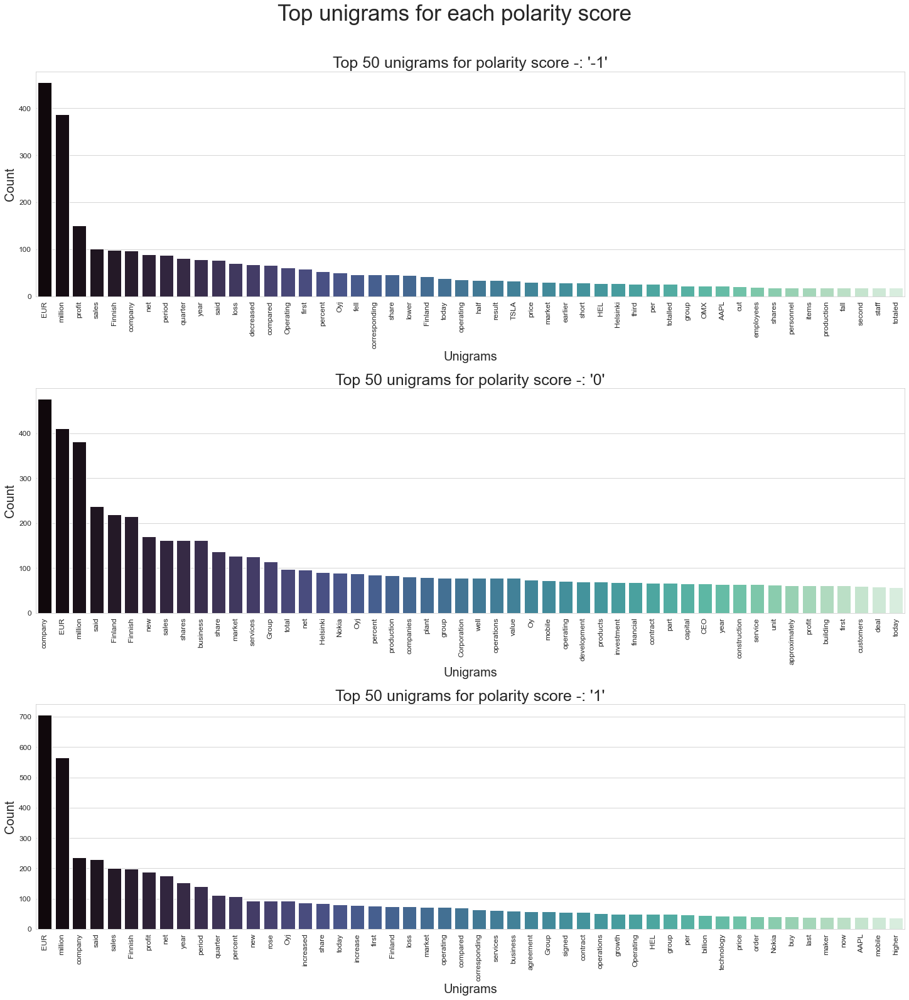

In [46]:
keylist = list(unigram_dict.keys())
fig, ax = plt.subplots(nrows=3, ncols=1, constrained_layout=True, figsize=(20,22))
sns.set_style('whitegrid')
for i in range(len(keylist)):
    sns.barplot(x = list(unigram_dict[keylist[i]].keys())[:50], y = list(unigram_dict[keylist[i]].values())[:50], ax = ax[i], palette = sns.color_palette("mako", n_colors = 50))
    ax[i].set_xlabel('Unigrams', size = 20)
    ax[i].set_ylabel('Count', size = 20)
    ax[i].set_xticklabels(list(unigram_dict[keylist[i]].keys())[:50], rotation = 90, size = 12)
    ax[i].set_title('Top 50 unigrams for polarity score -: \''+str(keylist[i])+'\'', size = 25)
    ax[i].tick_params(axis='y', labelsize=12)
plt.suptitle('Top unigrams for each polarity score\n', size = 35)
fig.savefig('Unigrams_polscore_exclSentiment140.png')
plt.show()

### (e) Generating top bigrams of the training dataset -:

In [47]:
Train_setproc['Bigrams'] = Train_setproc['Sent_toknd'].apply(lambda x: [' '.join(grams) for grams in ngrams(x, 2)])
bigram_dict = gram_dict_generator(Train_setproc, 'Bigrams')

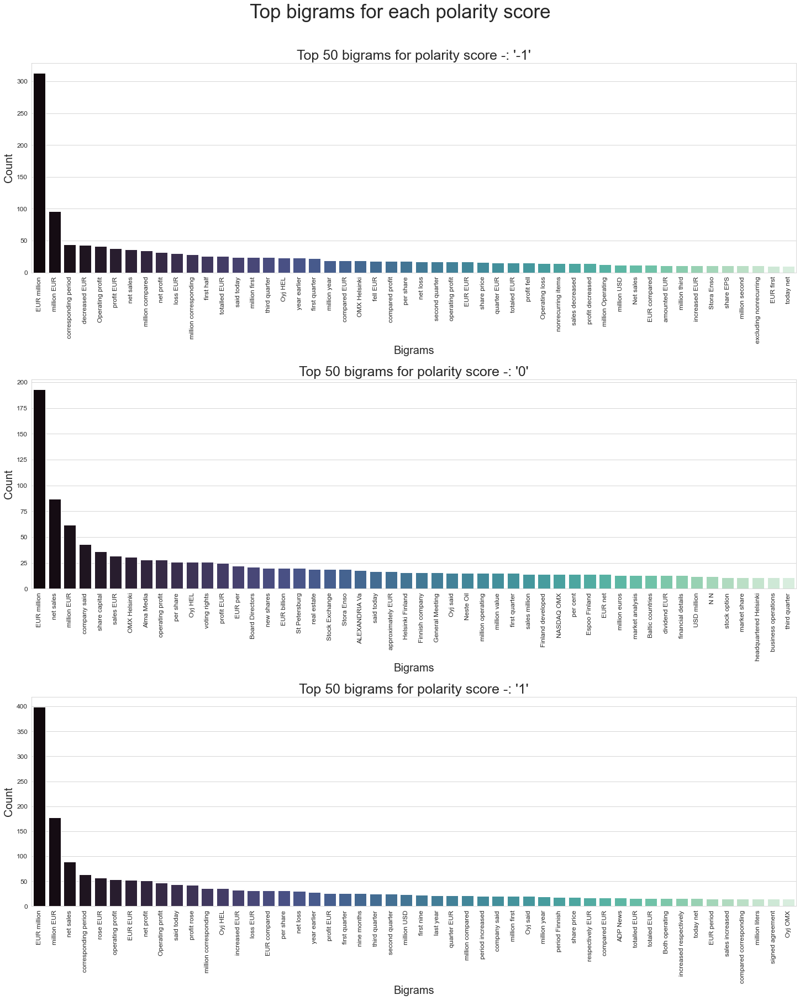

In [48]:
fig, ax = plt.subplots(nrows=3, ncols=1, constrained_layout=True, figsize=(20,25))
sns.set_style('whitegrid')
for i in range(len(keylist)):
    sns.barplot(x = list(bigram_dict[keylist[i]].keys())[:50], y = list(bigram_dict[keylist[i]].values())[:50], ax = ax[i], palette = sns.color_palette("mako", n_colors = 50))
    ax[i].set_xlabel('Bigrams', size = 20)
    ax[i].set_ylabel('Count', size = 20)
    ax[i].set_xticklabels(list(bigram_dict[keylist[i]].keys())[:50], rotation = 90, size = 12)
    ax[i].set_title('Top 50 bigrams for polarity score -: \''+str(keylist[i])+'\'', size = 25)
    ax[i].tick_params(axis='y', labelsize=12)
plt.suptitle('Top bigrams for each polarity score\n', size = 35)
fig.savefig('Bigrams_polscore_exclSentiment140.png')
plt.show()

### (f) Generating top trigrams of the training dataset -:

In [49]:
Train_setproc['Trigrams'] = Train_setproc['Sent_toknd'].apply(lambda x: [' '.join(grams) for grams in ngrams(x, 3)])
trigram_dict = gram_dict_generator(Train_setproc, 'Trigrams')

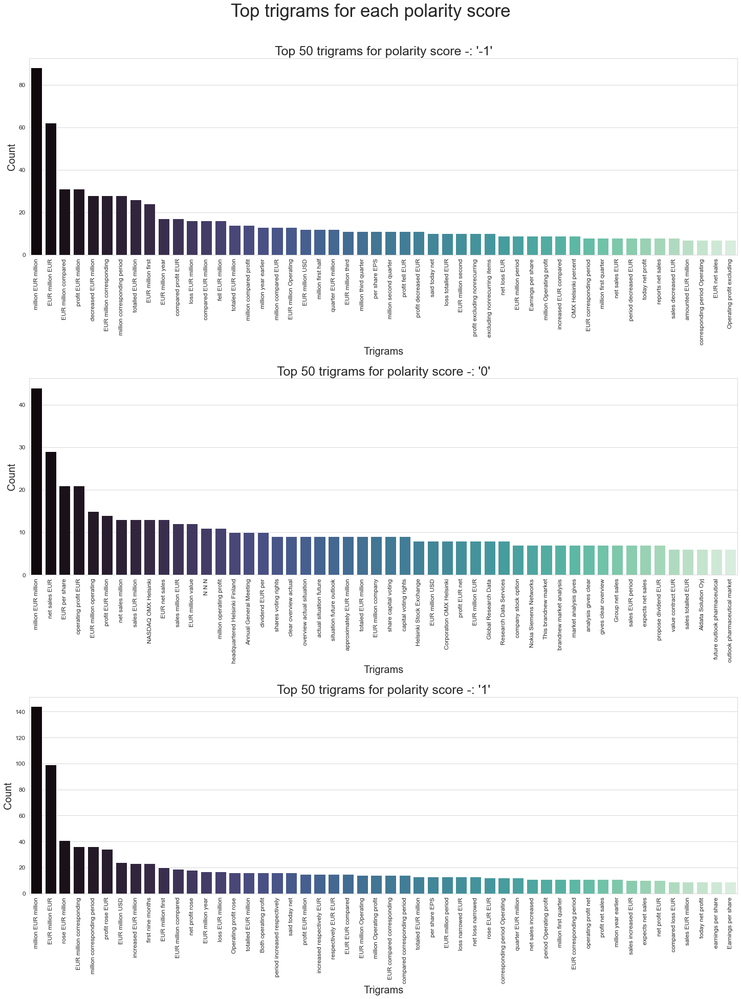

In [50]:
fig, ax = plt.subplots(nrows=3, ncols=1, constrained_layout=True, figsize=(20,27))
sns.set_style('whitegrid')
for i in range(len(keylist)):
    sns.barplot(x = list(trigram_dict[keylist[i]].keys())[:50], y = list(trigram_dict[keylist[i]].values())[:50], ax = ax[i], palette = sns.color_palette("mako", n_colors = 50))
    ax[i].set_xlabel('Trigrams', size = 20)
    ax[i].set_ylabel('Count', size = 20)
    ax[i].set_xticklabels(list(trigram_dict[keylist[i]].keys())[:50], rotation = 90, size = 12)
    ax[i].set_title('Top 50 trigrams for polarity score -: \''+str(keylist[i])+'\'', size = 25)
    ax[i].tick_params(axis='y', labelsize=12)
plt.suptitle('Top trigrams for each polarity score\n', size = 35)
fig.savefig('Trigrams_polscore_exclSentiment140.png')
plt.show()

### (g) Generating Wordcloud for the training dataset -:

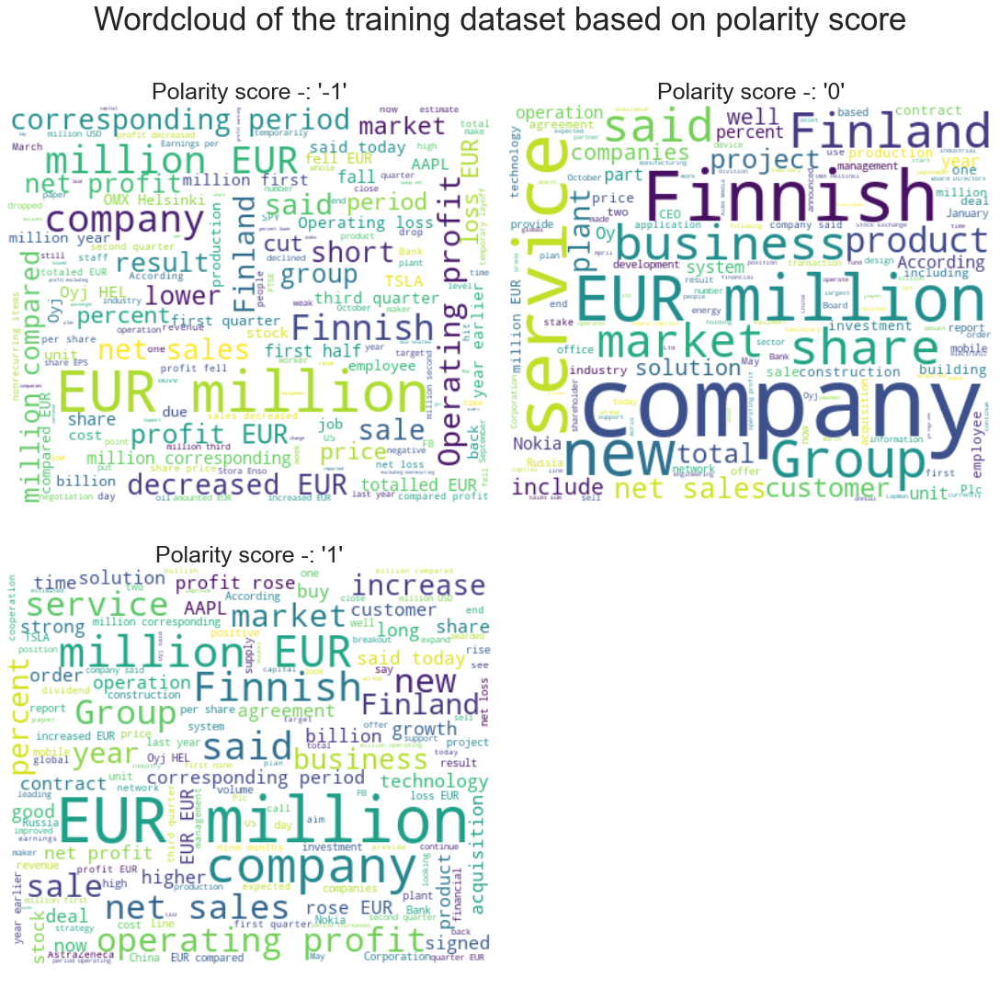

In [51]:
req_rows = int(len(keylist)/2) if len(keylist)%2==0 else int(len(keylist)/2) + 1
fig, axs = plt.subplots(nrows=req_rows, ncols=2, figsize = (15,15), constrained_layout = True)
i = 0
index = 0
while i < len(keylist):
    j=0
    while j < 2:
        wc = WordCloud(width=400, height=330, max_words=150, background_color="white", stopwords = stp_wrds).generate(' '.join(Train_setproc['Sent_toknd'][i]))
        axs[index,j].imshow(wc, interpolation='bilinear')
        axs[index,j].axis("off")
        axs[index,j].set_title('Polarity score -: \''+str(keylist[i])+'\'', size = 25)
        j = j + 1
        i = i + 1
        if i == len(keylist):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Wordcloud of the training dataset based on polarity score\n', size = 35)
fig.savefig('Wordcloud_polscore_exclSentiment140.png')
plt.show()

### (i) Train set (including filtered Sentiment160 datasset)

### (a) Length of the dataset -:

## Implementing BERT

### (i) Preprocessing the dataset for BERT implementation

In [52]:
tokenizer1 = BertTokenizer.from_pretrained('bert-base-uncased')
tokenizer2 = BertTokenizer.from_pretrained('bert-large-uncased')

In [53]:
BERT_spcfc_prefix = '[CLS] '
BERT_spcfc_postfix = ' [SEP]'

def BERT_modifications(df):
    
    df['Sent_mod'] = [re.sub(r"http\S+", "", txt_data) for txt_data in df['Sentence']]   # Removing urls from tweets
    df['Sent_mod'] = [contractions.fix(txt_data) for txt_data in df['Sent_mod']]         # Fixing contractions
    df['Sent_mod'] = [txt_data.translate(dict((ord(char), None) for char in string.punctuation)) for txt_data in df['Sent_mod']] # Removing punctuation

    # Taking care of >, < , =, & signs
    df['Sent_mod'] = [re.sub(r"<3", "love", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"&gt;", ">", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"&lt;", "<", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"&amp;", "&", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r">", "greater than", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"<", "less than", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"=", "is equal to", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"&", "and", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"It's'", "It is", txt_data) for txt_data in df['Sent_mod']]

    # Taking care of the slangs
    df['Sent_mod'] = [re.sub(r"w/e", "whatever", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"w/", "with", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"lmao", "laughing my ass off", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"rofl", "rolling on the floor laughing", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"roflmao", "rolling on the floor laughing my ass off", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"recentlu", "recently", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"exp0sed", "exposed", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"amirite", "am I right", txt_data) for txt_data in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r"USAgov", "USA government", txt_data) for txt_data in df['Sent_mod']]
    
    # Remove non-ascii words or characters
    df['Sent_mod'] = [''.join([i if ord(i) < 128 else '' for i in text]) for text in df['Sent_mod']]
    df['Sent_mod'] = [re.sub(r'_[\S]?',r'', txt_data) for txt_data in df['Sent_mod']]
    
    df['Sent_toknd'] = df['Sent_mod'].apply(lambda x: nltk.word_tokenize(x))
    df['Sent_toknd'] = [['million' if ((word == 'mn') or (word == 'mln')) else word for word in x] for x in df['Sent_toknd']]
    df['Sent_toknd'] = [['percent' if word == 'pct' else word for word in x] for x in df['Sent_toknd']]
    df['Sent_toknd'] = [['billion' if word == 'bn' else word for word in x] for x in df['Sent_toknd']]
    df['Sent_toknd'] = [['EUR' if ((word == 'eur') or (word == 'euro') or (word == 'EURm')) else word for word in x] for x in df['Sent_toknd']]
    df['Sent_toknd'] = [[word.lower() for word in x] for x in df['Sent_toknd']]
    df['ProcessedText_length'] = [len(sent) for sent in df['Sent_toknd']]
    
    df['Sent_toknd'] = df['Sent_toknd'].apply(lambda x: ' '.join(x)) # Joining to use the BERT tokenizer
    df['Sent_toknd'] = BERT_spcfc_prefix + df['Sent_toknd'] + BERT_spcfc_postfix
    df['Sent_toknd_base'] = df['Sent_toknd'].apply(lambda x: tokenizer1.tokenize(x)) #Implementing BERT base tokenizer
    df['Sent_toknd_large'] = df['Sent_toknd'].apply(lambda x: tokenizer2.tokenize(x)) #Implementing BERT large tokenizer
    df['Sent_toknd_base_length'] = [len(sent) for sent in df.Sent_toknd_base]
    df['Sent_toknd_base_length'] = [len(sent) for sent in df.Sent_toknd_large]
    
    return df

In [54]:
BERT_dtset1 = BERT_modifications(deepcopy(Train_set))

In [55]:
# Intialising labels for later use in generating losses
label_dict = dict()
for i, l in enumerate(list(BERT_dtset1.Sentiment_score.value_counts().keys())):
    label_dict.update({l: i})

BERT_dtset1['label'] = [label_dict[label] for label in BERT_dtset1.Sentiment_score]

### (ii) Importing BERT specific modules

In [56]:
# BERT imports
import torch
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler
from keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from transformers import BertTokenizer, BertConfig
from transformers import AdamW, BertForSequenceClassification
from transformers import get_linear_schedule_with_warmup
from tqdm import tqdm, trange
import io

# specify GPU device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device :', device)
n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

Device : cpu


### (iii) BERT specific preprocessing

In [57]:
BERT_dtset1 = BERT_dtset1.sample(frac=1, random_state = 903507276)
BERT_dtset1.reset_index(drop = True, inplace = True)
MAX_LEN = 128                                                   # Set the maximum sequence length.
tokenized_texts = BERT_dtset1['Sent_toknd_base']                # using the base model
labels = np.array(BERT_dtset1['label'])
tokenizer = tokenizer1

# Pad our input tokens
input_ids = pad_sequences([tokenizer.convert_tokens_to_ids(txt) for txt in tokenized_texts],
                          maxlen=MAX_LEN, dtype="long", truncating="post", padding="post")

# Create a mask of 1s for each token followed by 0s for padding
attention_masks = []
for seq in input_ids:
    seq_mask = [float(i>0) for i in seq]
    attention_masks.append(seq_mask)

### (iv) BERT implementation

In [58]:
# Training and Validation sets
train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, 
                                                            random_state = 903507276, test_size=0.2)
train_masks, validation_masks, _, _ = train_test_split(attention_masks, input_ids,
                                             random_state = 903507276, test_size=0.2)
                                             
# Converting into torch tensors
train_inputs = torch.tensor(train_inputs)
validation_inputs = torch.tensor(validation_inputs)
train_labels = torch.tensor(train_labels)
validation_labels = torch.tensor(validation_labels)
train_masks = torch.tensor(train_masks)
validation_masks = torch.tensor(validation_masks)

# batch size
batch_size = 32

# Create an iterator of our data with torch DataLoader 
train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=batch_size)
validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=batch_size)

In [ ]:
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels = len(set(list(labels))))

# Uncomment it for running on GPU
model.cuda()

In [59]:
# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

In [ ]:
# BERT fine-tuning parameters
param_optimizer = list(model.named_parameters())
no_decay = ['bias', 'gamma', 'beta']
optimizer_grouped_parameters = [{'params': [p for n, p in param_optimizer if not any(nd in n for nd in no_decay)],
                                 'weight_decay_rate': 0.01}, 
                                {'params': [p for n, p in param_optimizer if any(nd in n for nd in no_decay)],
                                 'weight_decay_rate': 0.0}]

optimizer = AdamW(optimizer_grouped_parameters, lr = 1e-4, eps = 1e-6)
validation_acc = []                      # Storing the validation accuracy
train_loss_set = []                      # Store our loss and accuracy for plotting
epochs = 10                               # Number of training epochs
total_steps = len(train_dataloader) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps = 500, num_training_steps = total_steps)

start = timeit.default_timer()

# BERT training loop
for _ in trange(epochs, desc="Epoch"):  
  
    ## TRAINING  
    # Set our model to training mode
    model.train()  
    # Tracking variables
    tr_loss = 0
    nb_tr_examples, nb_tr_steps = 0, 0
    # Train the data for one epoch
    for step, batch in enumerate(train_dataloader):
        # Add batch to GPU
        batch = tuple(t.to(device) for t in batch)
        # Unpack the inputs from our dataloader
        b_input_ids, b_input_mask, b_labels = batch

        # Clear out the gradients (by default they accumulate)
        optimizer.zero_grad()
        # Forward pass
        loss = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)[0]
        train_loss_set.append(loss.item())
        
        # Backward pass
        loss.backward()
        # Update parameters and take a step using the computed gradient
        optimizer.step()
        # Update tracking variables
        tr_loss += loss.item()
        nb_tr_examples += b_input_ids.size(0)
        nb_tr_steps += 1
        
        # Update the learning rate.
        scheduler.step()

    print("\nTrain loss: {}".format(tr_loss/nb_tr_steps))
       
    ## VALIDATION
    # Put model in evaluation mode
    model.eval()
    # Tracking variables 
    eval_loss, eval_accuracy = 0, 0
    nb_eval_steps, nb_eval_examples = 0, 0
    # Evaluate data for one epoch
    for batch in validation_dataloader:
        # Add batch to GPU
        batch = tuple(t.to(device) for t in batch)
        # Unpack the inputs from our dataloader
        b_input_ids, b_input_mask, b_labels = batch
        # Telling the model not to compute or store gradients, saving memory and speeding up validation
        with torch.no_grad():
          # Forward pass, calculate logit predictions
          logits = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)[0]    
        # Move logits and labels to CPU
        logits = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()
        tmp_eval_accuracy = flat_accuracy(logits, label_ids)    
        eval_accuracy += tmp_eval_accuracy
        nb_eval_steps += 1
        validation_acc.append(eval_accuracy/nb_eval_steps)
    print("\nValidation Accuracy: {}".format(eval_accuracy/nb_eval_steps))

stop = timeit.default_timer()
print("Program Executed in "+str((stop - start)/60)+' min')

In [ ]:
# Plotting training loss
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(8,5))
sns.set_style('whitegrid')
plt.title('BERT training loss', size = 20)
ax.set_xlabel('Batch', size = 15)
ax.set_ylabel('Loss', size = 15)
plt.plot(train_loss_set)
fig.savefig('BERT_training_loss.png')
plt.show()

In [ ]:
# Plotting validation accuracy
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(8,5))
sns.set_style('whitegrid')
plt.title('BERT validation accuracy', size = 20)
ax.set_xlabel('Batch', size = 15)
ax.set_ylabel('Accuracy', size = 15)
plt.plot(validation_acc)
fig.savefig('BERT_validation_accuracy.png')
plt.show()

### Training completed!!!!

### (iv) Initiating testing

In [60]:
Test_set = deepcopy(tweets_df[['created_at', 'text', 'Tw_handle']])
Test_set['created_at'] = [datetime.datetime.strftime(datetime.datetime.strptime(d,'%a %b %d %H:%M:%S +0000 %Y'), '%Y-%m-%d') for d in Test_set['created_at']]
Test_set.rename(columns={'Tw_handle':"Source", 'created_at':'Date', 'text':'Sentence'}, inplace = True)
Test_set['Source'] = 'Twitter - @' + Test_set['Source']
Test_set['Parent_Src'] = Test_set['Source']

# Concatenating with Newapi.org dataset
Newsapi_df['Parent_Src'] = 'Newsapi.org'
Test_set = pd.concat([Test_set, Newsapi_df])
Test_set.reset_index(drop=True, inplace = True)

# Concatenating with DataNews.io dataset
Datanewsio_df['Parent_Src'] = 'DataNews.io'
Test_set = pd.concat([Test_set, Datanewsio_df])
Test_set.reset_index(drop=True, inplace = True)

# Sorting out based on dates
Test_set['Sentence'] = Test_set['Sentence'].astype(str)
Test_set.sort_values(by='Date', inplace = True)
Test_set.drop_duplicates(inplace = True)
Test_set.reset_index(drop=True, inplace = True)
Test_set.to_csv('Final_test_set.csv', index = False)

In [61]:
Test_set.head()

,Date,Sentence,Source,Parent_Src
0,2019-09-01,Will Bitcoin's Looming Halving Ignite a Recove...,DataNews.io - ccn.com,DataNews.io
1,2019-09-01,RT @BloombergNRG: OPEC is banking on a Christm...,Twitter - @OPECnews,Twitter - @OPECnews
2,2019-09-01,RT @MarcellusGas: America is now the OPEC of n...,Twitter - @OPECnews,Twitter - @OPECnews
3,2019-09-01,RT @zerohedge: HONG KONG ARRESTS WORRYING DEVE...,Twitter - @OPECnews,Twitter - @OPECnews
4,2019-09-01,#ICYMI - EIA introduces redesigned Energy Expl...,Twitter - @EIAgov,Twitter - @EIAgov


### Descriptive stats of the Test dataset -: 

### (a) Length of the dataset -:

In [62]:
Test_set_EDA = deepcopy(Test_set)
print(Test_set_EDA.shape[0])

27358


### (b) No. of datapoints from each source -:

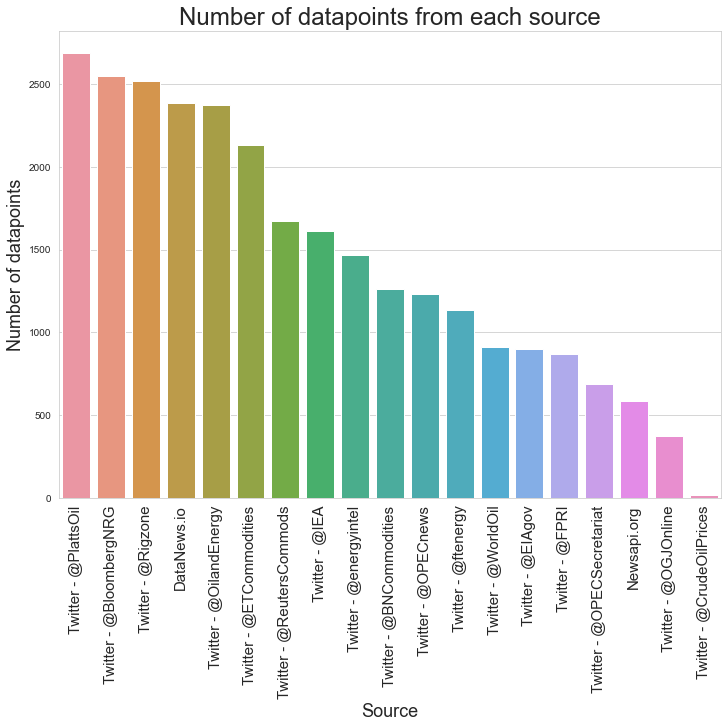

In [63]:
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(10,10))
sns.set_style('whitegrid')
sns.barplot(x = list(Test_set_EDA['Parent_Src'].value_counts().keys()), y = list(Test_set_EDA['Parent_Src'].value_counts()), ax = ax)
ax.set_xlabel('Source', size = 18)
ax.set_ylabel('Number of datapoints', size = 18)
plt.title('Number of datapoints from each source', size = 24)
ax.set_xticklabels(list(Test_set_EDA['Parent_Src'].value_counts().keys()), rotation = 90, size = 15)
fig.savefig('Test_dtpoints_source.png')
plt.show()

### (c) Number of words in each sentence/tweet -:

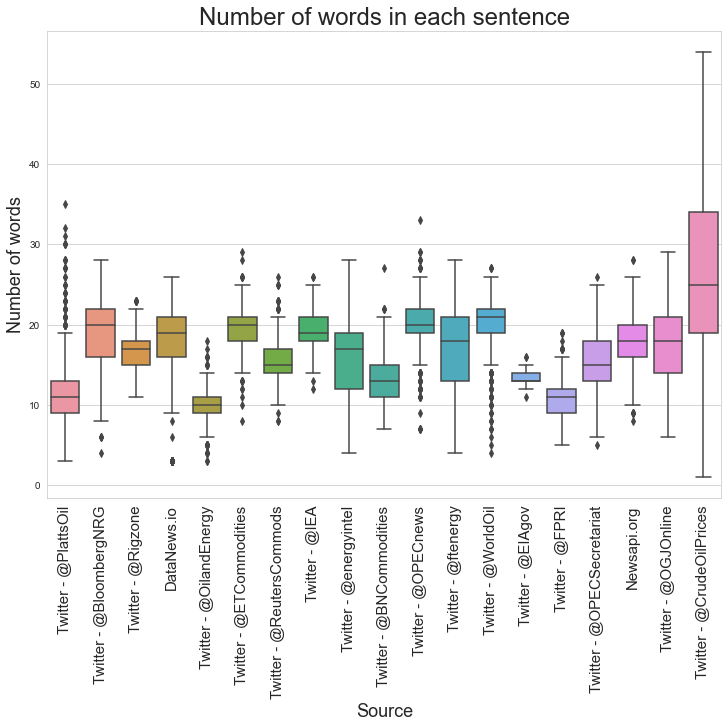

In [64]:
Test_set_EDA['wrds_in_sent'] = [len(txt.split(' ')) for txt in Test_set_EDA['Sentence']]
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(10,10))
sns.set_style('whitegrid')
sns.boxplot(x = Test_set_EDA['Parent_Src'], y = Test_set_EDA['wrds_in_sent'], ax = ax)
ax.set_xlabel('Source', size = 18)
ax.set_ylabel('Number of words', size = 18)
plt.title('Number of words in each sentence', size = 24)
ax.set_xticklabels(list(Test_set_EDA['Parent_Src'].value_counts().keys()), rotation = 90, size = 15)
fig.savefig('Test_wordsent_source.png')
plt.show()

### (d) Checking if all dates are present in the testing dataset

In [65]:
startDate = datetime.date(2019, 9, 1)
endDate =   datetime.date(2020, 11, 1)
delta = endDate - startDate

dtset_dates = list(dict.fromkeys(Test_set_EDA['Date']))
True_dates = [str(startDate + relativedelta(days=+x))[:10] for x in range(delta.days + 1)]

if len(list(dict.fromkeys(Test_set_EDA['Date']))) == delta.days+1:
    print('All the dates between Startdate - {} and Enddate - {} exist in the dataset'.format(str(startDate), str(endDate)))
else:
    print('All the dates between Startdate - {} and Enddate - {} do not exist in the dataset'.format(str(startDate), str(endDate)))
    print('\n', [x for x in True_dates if x not in dtset_dates], ' - does not exit in the dataset')

All the dates between Startdate - 2019-09-01 and Enddate - 2020-11-01 do not exist in the dataset

 ['2019-10-05']  - does not exit in the dataset


### (e) No. of datapoints for each date

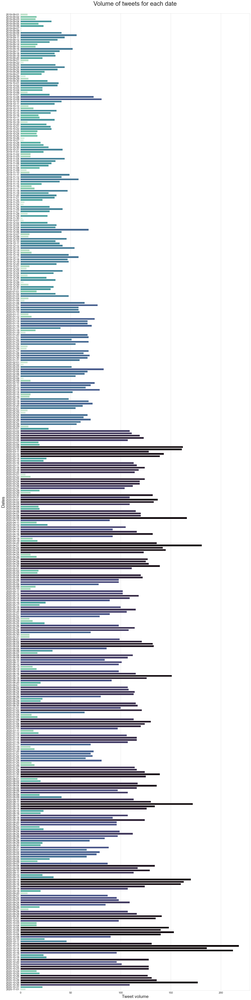

In [66]:
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(20,80))
sns.set_style('whitegrid')
pal = sns.color_palette("mako", n_colors = len(dtset_dates))
rank = Test_set_EDA.groupby('Date').size().argsort().argsort()
sns.barplot(x = list(Test_set_EDA.groupby(['Date']).size()), y = dtset_dates, ax = ax, palette = np.array(pal[::-1])[rank])
ax.set_xlabel('Tweet volume', size = 25)
ax.set_ylabel('Dates', size = 25)
ax.set_title('Volume of tweets for each date\n', size = 35)
ax.tick_params(axis='y', labelsize=15)
ax.tick_params(axis='x', labelsize=15)
fig.savefig('Test_dtpoints_date.png')
plt.show()

### (f) No. of datapoints for each week

In [274]:
Test_set_EDA['Date'] = pd.to_datetime(Test_set_EDA['Date'], format = '%Y-%m-%d').dt.date
Test_set_EDA['Week'] = [d.isocalendar()[1] for d in Test_set_EDA['Date']]

start = timeit.default_timer()
Actual_Weeks = []
for d in list(Test_set_EDA['Date']):        # This is to fix the ISO week year-end BS.
    if (((d.year - startDate.year) == 0) & ((Test_set_EDA.loc[Test_set_EDA['Date'] == d, 'Week'].iloc[0]) < startDate.isocalendar()[1])):
        Actual_Weeks.append(((Test_set_EDA.loc[Test_set_EDA['Date'] == d, 'Week'].iloc[0] + 
                        (max(Test_set_EDA['Week'])*(d.year - startDate.year + 1)) - startDate.isocalendar()[1] + 1)))
    else:
        Actual_Weeks.append(((Test_set_EDA.loc[Test_set_EDA['Date'] == d, 'Week'].iloc[0] + 
                        (max(Test_set_EDA['Week'])*(d.year - startDate.year)) - startDate.isocalendar()[1] + 1)))
Test_set_EDA['Week'] = Actual_Weeks
stop = timeit.default_timer()
print("Program Executed in "+str((stop - start))+' sec')

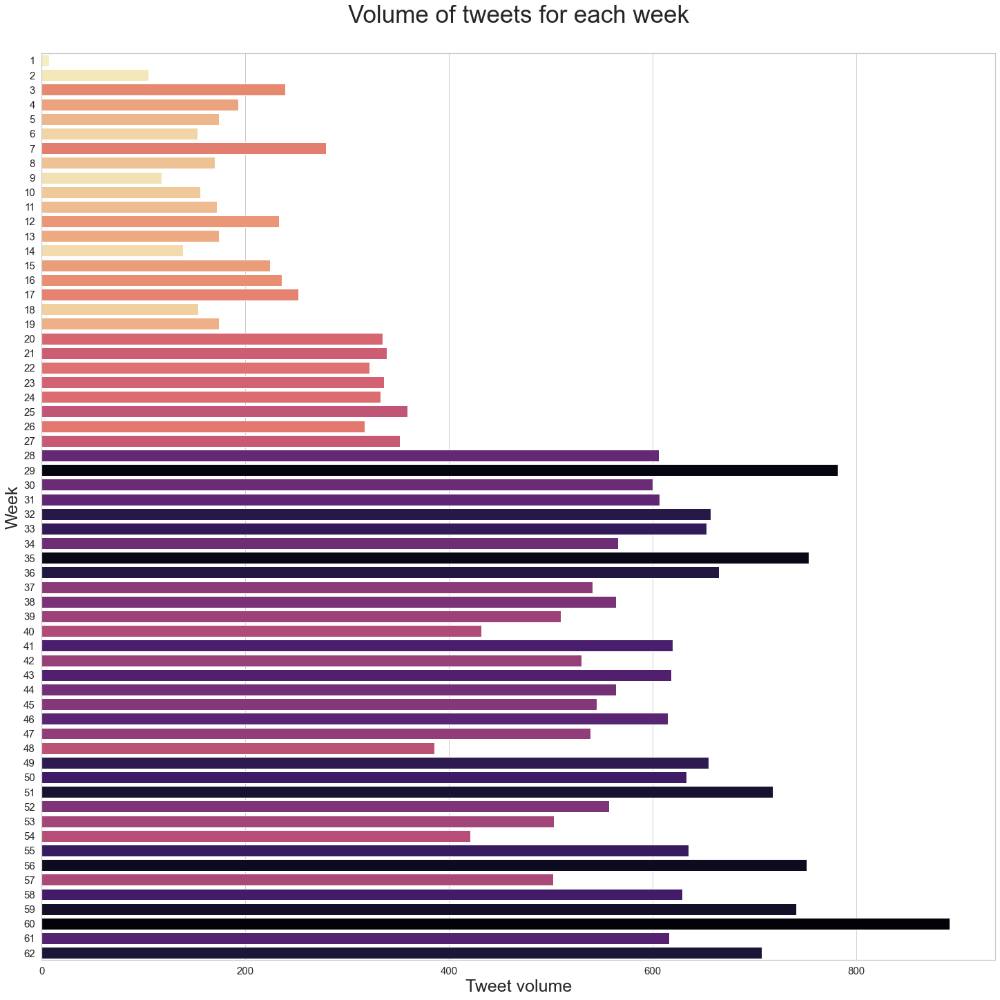

In [289]:
fig, ax = plt.subplots(nrows=1, ncols=1, constrained_layout=True, figsize=(20,20))
sns.set_style('whitegrid')
pal = sns.color_palette("magma", n_colors = len(list(dict.fromkeys(Test_set_EDA['Week']))))
rank = Test_set_EDA.groupby('Week').size().argsort().argsort()
sns.barplot(x = list(Test_set_EDA.groupby(['Week']).size()), 
            y = [str(x) for x in list(dict.fromkeys(Test_set_EDA['Week']))], ax = ax, palette = np.array(pal[::-1])[rank])
ax.set_xlabel('Tweet volume', size = 25)
ax.set_ylabel('Week', size = 25)
ax.set_title('Volume of tweets for each week\n', size = 35)
ax.tick_params(axis='y', labelsize=15)
ax.tick_params(axis='x', labelsize=15)
fig.savefig('Test_dtpoints_week.png')
plt.show()

### (g) Wordcloud of the final testing dataset

In [330]:
# to be generated after generating the BERT testset and SentforVader column
test_fwordcloud = BERT_testset.groupby('Parent_Src').apply(lambda x: ''.join(x.SentforVader)).to_dict()
username_v2 = list(test_fwordcloud.keys())

In [331]:
for user in username_v2:
    txt_data = test_fwordcloud[user]
    
    soup = BeautifulSoup(txt_data)                                                           # Removing HTML tags if any
    txt_data = soup.get_text()
    
    txt_data =  re.sub(r"http\S+", "", txt_data)                                             # Removing urls from tweets
    
    txt_data = txt_data.translate(dict((ord(char), None) for char in string.punctuation))    # Removing punctuation
    
    txt_data = txt_data.translate(str.maketrans('', '', string.digits))                      # Removing Numbers
    
    txt_data = contractions.fix(txt_data)                                                    # Fixing contractions
    
    txt_data = txt_data.replace('\n', '').replace('\r', '')                                  # Removing \n and \r
    
    emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642" 
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030""]+", re.UNICODE)
    txt_data = emoji_pattern.sub(r'', txt_data)
    txt_data = re.sub(r"will", "", txt_data)                                                 # Removing 'will'
    txt_data = re.sub(r"column", "", txt_data)                                               # Removing 'column'
    txt_data = re.sub(r"learn", "", txt_data)                                                # Removing 'learn'
    txt_data = re.sub(r"yous", "", txt_data)                                                 # Removing 'yous'
    txt_data = re.sub(r"amp", "", txt_data)                                                  # Removing 'amp'
    txt_data = re.sub(r"via", "", txt_data)                                                  # Removing 'via'
    
    test_fwordcloud[user] = txt_data

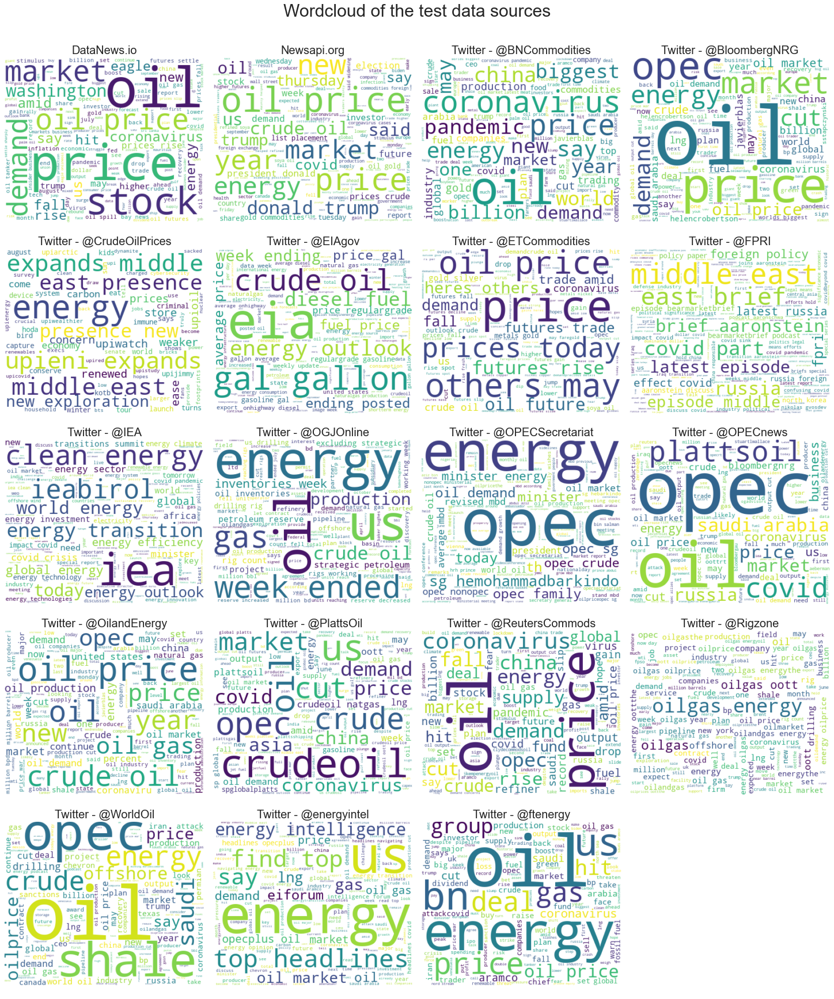

In [344]:
req_rows = int(len(username_v2)/4) if len(username_v2)%4==0 else int(len(username_v2)/4) + 1
fig, axs = plt.subplots(nrows=req_rows, ncols=4, figsize = (20,24), constrained_layout = True)
i = 0
index = 0
while i < len(username_v2):
    j=0
    while j < 4:
        wc = WordCloud(width=400, height=330, max_words=150, background_color="white", stopwords = stp_wrds).generate(test_fwordcloud[username_v2[i]])
        axs[index,j].imshow(wc, interpolation='bilinear')
        axs[index,j].axis("off")
        axs[index,j].set_title(str(username_v2[i]), size = 20)
        j = j + 1
        i = i + 1
        if (i == len(username_v2)) & (j != 2):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Wordcloud of the test data sources\n', size = 30)
fig.savefig('Wordcloud_testsource_all.png')
plt.show()

### Generating results using BERT model trained and tuned above

In [67]:
# BERT specific modification on the testing dataset
BERT_testset = BERT_modifications(deepcopy(Test_set))

# Pad our input tokens(using the base model)
input_ids_tst = pad_sequences([tokenizer.convert_tokens_to_ids(txt) for txt in BERT_testset['Sent_toknd_base']],
                          maxlen=MAX_LEN, dtype="long", truncating="post", padding="post")

# Create a mask of 1s for each token followed by 0s for padding
attention_masks_tst = []
for seq in input_ids_tst:
    seq_mask = [float(i>0) for i in seq]
    attention_masks_tst.append(seq_mask)

In [68]:
# create test tensors
prediction_inputs = torch.tensor(input_ids_tst)
prediction_masks = torch.tensor(attention_masks_tst)
prediction_data = TensorDataset(prediction_inputs, prediction_masks)
prediction_sampler = SequentialSampler(prediction_data)
prediction_dataloader = DataLoader(prediction_data, sampler=prediction_sampler, batch_size=batch_size)

In [ ]:
# Running BERT to generate results
model.eval()                                         # Putting model in evaluation mode
prediction_arr = np.array([]).reshape(0,3)
for batch in prediction_dataloader:
    
    batch = tuple(t.to(device) for t in batch)       # Add batch to GPU
    b_input_ids, b_input_mask = batch
    
    with torch.no_grad():                            # Because no need to compute the gradients, just the forward pass!
        logits = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)[0]
        
    logits = F.softmax(logits, dim = 1).detach().cpu().numpy()
    prediction_arr = np.concatenate((prediction_arr, logits), axis = 0)

In [ ]:
#with torch.no_grad():                            # Because no need to compute the gradients, just the forward pass!
#    logits = model(prediction_inputs.to(device), token_type_ids=None, attention_mask=prediction_masks.to(device))[0]
#    logits = logits.detach().cpu().numpy()

In [69]:
#pd.DataFrame(prediction_arr).to_csv('BERT_results_testset.csv', index = False)

# Retrieving results
prediction_arr = pd.read_csv('BERT_results_testset.csv')
prediction_arr.rename(columns={'0':'0.0', '1':'1.0', '2':'-1.0'}, inplace = True)

# Adding the BERT labels to test set
Inv_label_dict = {v: k for k,v in label_dict.items()}
Results_set = deepcopy(Test_set)
Results_set['BERT_label'] = [Inv_label_dict[x] for x in list(np.array(prediction_arr).argmax(axis = 1))]

### BERT implementation concludes !!

### Implementing VADER Sentiment Analyser (results between [-1, 1])...

In [70]:
BERT_testset = BERT_modifications(deepcopy(Test_set))
darth_vader = SentimentIntensityAnalyzer()
BERT_testset['SentforVader'] = BERT_testset['Sent_toknd'].apply(lambda x: x[len(BERT_spcfc_prefix):-len(BERT_spcfc_postfix)])
BERT_testset['SentforVader_length'] = BERT_testset['SentforVader'].apply(lambda x: len(nltk.word_tokenize(x)))
Results_set['VADER_label'] = BERT_testset['SentforVader'].apply(lambda x: darth_vader.polarity_scores(x)['compound'])
Results_set.drop(Results_set[BERT_testset['SentforVader_length']==0].index, inplace = True)
BERT_testset.drop(BERT_testset[BERT_testset['SentforVader_length']==0].index, inplace = True)

### VADER implementation concludes !!

### Implementing TextBlob Sentiment Analyser (results between [-1, 1])...

In [71]:
Results_set['TextBlob_label'] = BERT_testset['SentforVader'].apply(lambda x: TextBlob(x).sentiment.polarity)

### TextBlob Sentiment Analyser implementation concludes !!

### Implementing IBM watson Sentiment Analyser (results between [-1, 1])...

In [72]:
# Retrieving the IBM Watson keys
f = open("Required_keys_IBMwatson.txt", "r")
IBMwatson_file = f.read().split('\n')
IBMwatson_keys, IBMwatson_url = tuple(l.split('=')[1].strip() for l in IBMwatson_file)
f.close()

In [73]:
IBM_authenticator = IAMAuthenticator(IBMwatson_keys)
NLU = NaturalLanguageUnderstandingV1(version = '2020-08-01', authenticator = IBM_authenticator)
NLU.set_service_url(IBMwatson_url)

In [74]:
def IBM_watson_sentiment(input_text): 
    response = NLU.analyze(text = input_text, features = Features(sentiment=SentimentOptions()), language='en').get_result()
    res = response.get('sentiment').get('document').get('score')
    return res

In [ ]:
#start = timeit.default_timer()
#Results_set['IBMwatson_label'] = BERT_testset['SentforVader'].apply(lambda x: IBM_watson_sentiment(x))
#stop = timeit.default_timer()
#print("Program Executed in "+str((stop - start))+' sec')

In [75]:
Results_set['IBMwatson_label'] = Results_set['VADER_label']    # For temporary case. Its taking way to long to run
Results_set.to_csv('Final_results.csv', index = False)
#Results_set = pd.read_csv('./Final_results.csv')

### IBM watson Sentiment Analyser implementation concludes !!

### Retrieving the crude oil prices (Frequency - Daily)...

In [122]:
Crude_oil = pd.read_csv('Crude_oil_WTI.csv', index_col = 0)
idx = pd.date_range(Crude_oil.index[0], Crude_oil.index[len(Crude_oil.index)-1]) # Considering all dates between start and end
Crude_oil.index = pd.DatetimeIndex(Crude_oil.index)
Crude_oil = Crude_oil.reindex(idx, fill_value = np.NaN)       # Filling missing dates with NaN
Crude_oil['DCOILWTICO'].replace('.', np.NaN, inplace = True)
Crude_oil.ffill(inplace = True)                               # Forward filling for missing data
Crude_oil.reset_index(drop = False, inplace = True)
Crude_oil.rename(columns={'index':'Date', 'DCOILWTICO':'Crude_Oil'}, inplace = True)
Crude_oil['Date'] = pd.to_datetime(Crude_oil['Date'], format='%Y-%m-%d').dt.date
Crude_oil = Crude_oil[(Crude_oil['Date'] >= startDate) & (Crude_oil['Date'] <= endDate)]
Crude_oil.reset_index(drop = True, inplace = True)
Crude_oil['Crude_Oil'] = Crude_oil['Crude_Oil'].astype(float)

In [123]:
Crude_oil.head()

,Date,Crude_Oil
0,2019-09-01,55.07
1,2019-09-02,55.07
2,2019-09-03,53.91
3,2019-09-04,56.22
4,2019-09-05,56.33


### Retrieving weekly crude oil prices from the daily file...

In [264]:
Crude_oilW = deepcopy(Crude_oil)
Crude_oilW['Week'] = [d.isocalendar()[1] for d in Crude_oilW['Date']]
Actual_Weeks = []
for d in list(Crude_oilW['Date']):          # This is to fix the ISO week year-end BS.
    if (((d.year - startDate.year) == 0) & ((Crude_oilW.loc[Crude_oilW['Date'] == d, 'Week'].iloc[0]) < startDate.isocalendar()[1])):
        Actual_Weeks.append(((Crude_oilW.loc[Crude_oilW['Date'] == d, 'Week'].iloc[0] + 
                        (max(Crude_oilW['Week'])*(d.year - startDate.year + 1)) - startDate.isocalendar()[1] + 1)))
    else:
        Actual_Weeks.append(((Crude_oilW.loc[Crude_oilW['Date'] == d, 'Week'].iloc[0] + 
                        (max(Crude_oilW['Week'])*(d.year - startDate.year)) - startDate.isocalendar()[1] + 1)))
Crude_oilW['Week'] = Actual_Weeks

In [265]:
Crude_oilW = Crude_oilW[['Week', 'Crude_Oil']].groupby('Week').mean()
Crude_oilW.reset_index(drop = False, inplace = True)

In [439]:
Crude_oilW.head()

,Week,Crude_Oil
0,1,55.070000
1,2,55.840000
2,3,55.760000
3,4,58.928571
4,5,56.625714


## Final analysis

### a) Plotting crude oil with the average sentiment (Frequency - Daily)

In [367]:
Plot_set = deepcopy(Results_set[['Date', 'BERT_label', 'VADER_label', 'TextBlob_label', 'IBMwatson_label']].groupby('Date').mean())
idx = pd.date_range(str(startDate), str(endDate))        # Considering all dates between start and end      
Plot_set.index = pd.DatetimeIndex(Plot_set.index)
Plot_set = Plot_set.reindex(idx, fill_value = np.NaN)    # Filling missing dates with NaN
Plot_set.ffill(inplace = True)                           # Forward filling for missing data
Plot_set.reset_index(drop = False, inplace = True)
Plot_set.rename(columns={'index':'Date'}, inplace = True)
Plot_set['Date'] = pd.to_datetime(Plot_set['Date'], format='%Y-%m-%d').dt.date.astype(str)
Plot_set['Crude_Oil'] = Crude_oil['Crude_Oil']

In [368]:
Plot_set.head()

,Date,BERT_label,VADER_label,TextBlob_label,IBMwatson_label,Crude_Oil
0,2019-09-01,0.714286,0.322586,0.042857,0.322586,55.07
1,2019-09-02,0.250000,0.057694,0.093665,0.057694,55.07
2,2019-09-03,0.600000,0.228633,0.148434,0.228633,53.91
3,2019-09-04,0.096774,0.044529,0.109887,0.044529,56.22
4,2019-09-05,0.055556,0.098922,0.185494,0.098922,56.33


In [369]:
keylist = list(Plot_set.columns[1:-1])
colors = ['Red', 'darkgreen', 'darkmagenta', 'brown', 'grey'][:len(keylist)]
colors_val = dict(zip(keylist, colors))

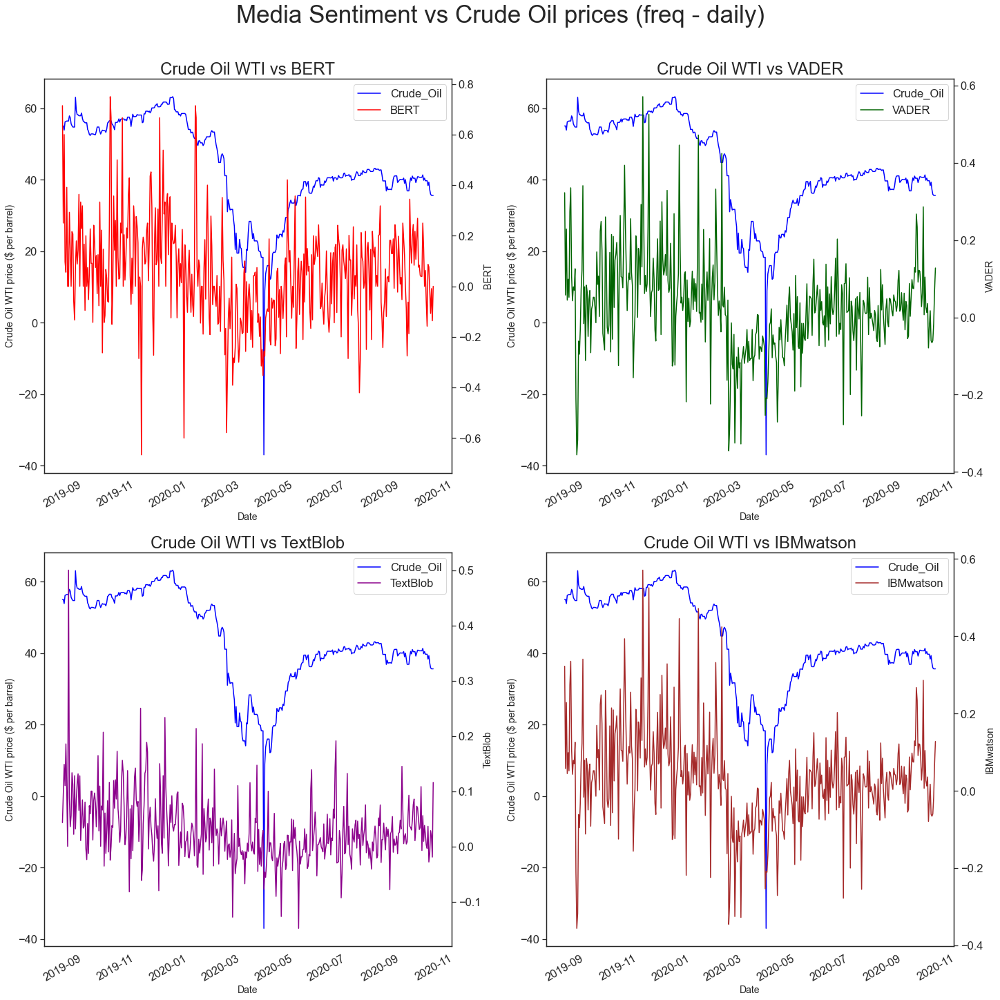

In [370]:
req_rows = int(len(keylist)/2) if len(keylist)%2==0 else int(len(keylist)/2) + 1
fig, axs = plt.subplots(nrows=req_rows, ncols=2, figsize = (20,20), constrained_layout = True)
i = 0
index = 0
while i < len(keylist):
    j=0
    while j < 2:
        sns.set_style('white')
        Plot_set['Date'] = pd.to_datetime(Plot_set['Date'], format = '%Y-%m-%d')
        axs[index,j].plot(Plot_set['Date'], Plot_set['Crude_Oil'], color = "Blue", label='Crude_Oil')
        axs[index,j].set_xlabel('Date', size = 14)
        axs[index,j].set_ylabel('Crude Oil WTI price ($ per barrel)', size = 14)
        axs[index,j].set_title('Crude Oil WTI vs ' + keylist[i][:-6], size = 24)
        axs[index,j].set_xticklabels(list(Plot_set['Date']), rotation=30)
        uselabels = list(axs[index,j].get_xticklabels())
        ax2 = axs[index,j].twinx()
        sns.set_style('white')
        ax2.plot(Plot_set['Date'], Plot_set[keylist[i]], color = colors_val[keylist[i]], label=keylist[i][:-6])
        ax2.set_ylabel(keylist[i][:-6], size = 14)
        
        # For Legend
        ln_1, lab_1 = axs[index,j].get_legend_handles_labels()
        ln_2, lab_2 = ax2.get_legend_handles_labels()
        lns = ln_1 + ln_2
        labs = lab_1 + lab_2
        ax2.legend(lns, labs, loc=0)
        
        j = j + 1
        i = i + 1
        if (i == len(keylist)) & (j != 2):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Media Sentiment vs Crude Oil prices (freq - daily)\n', size = 35)
fig.savefig('Crude_oil_vs_mediasentiments.png')
plt.show()

### b) Calculating mutual information (MI) values

In [428]:
MI1 = mutual_info_regression(np.array(Plot_set[keylist]), np.array(Plot_set['Crude_Oil']))
MI1 = dict(zip(keylist, MI1))
MI1 = pd.DataFrame.from_dict(MI1, orient = 'index')
MI1.rename(columns = {0:'MI daily actual'}, inplace = True)

In [429]:
MI1

,MI daily actual
BERT_label,0.190096
VADER_label,0.185157
TextBlob_label,0.047880
IBMwatson_label,0.185157


### c) Crude oil Vs. average sentiment trends (Fitting polynomial regression)

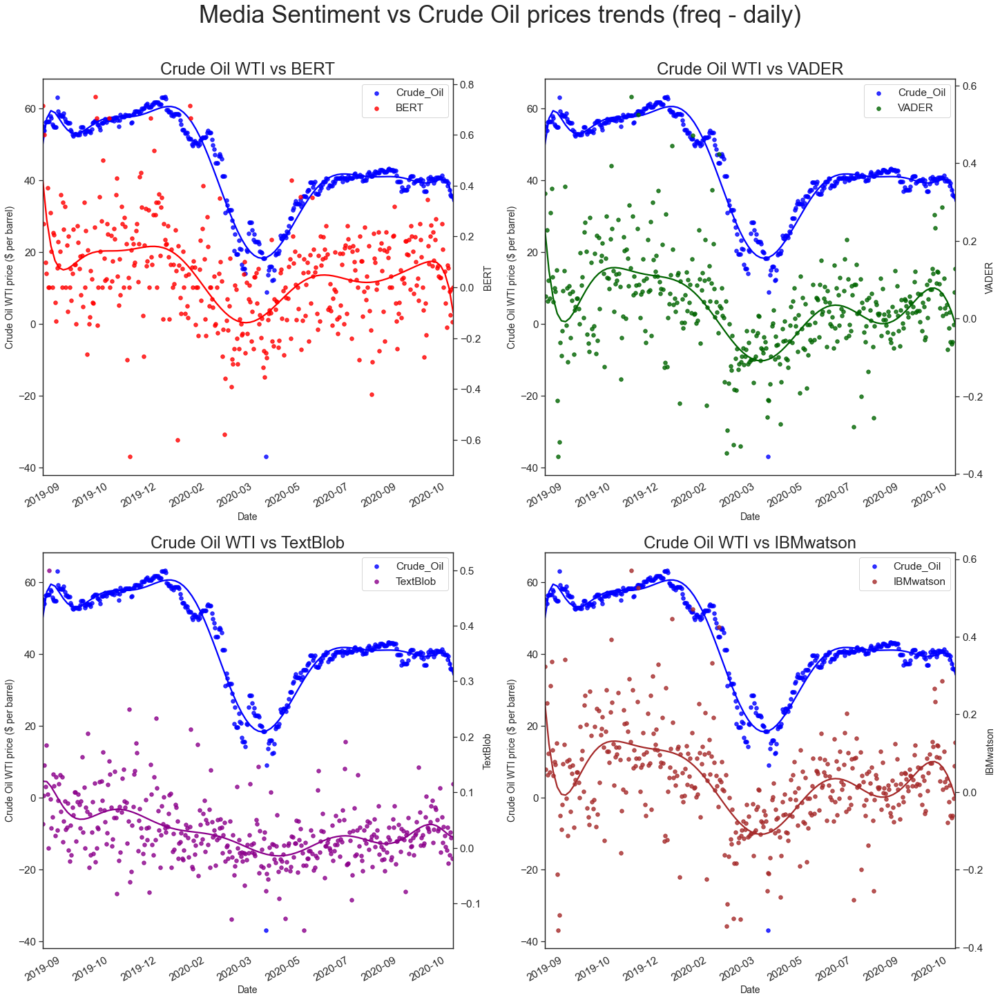

In [140]:
val = 53 # for 9 equally spaced observations
req_rows = int(len(keylist)/2) if len(keylist)%2==0 else int(len(keylist)/2) + 1
fig, axs = plt.subplots(nrows=req_rows, ncols=2, figsize = (20,20), constrained_layout = True)
SA_regvals = {}
i = 0
index = 0
while i < len(keylist):
    j=0
    while j < 2:
        sns.set_style('white')
        Plot_set['Date'] = pd.to_datetime(Plot_set['Date'], format = '%Y-%m-%d')
        p1 = sns.regplot(x = Plot_set.index, y = Plot_set['Crude_Oil'], color = "Blue", ax = axs[index,j], 
                    scatter_kws={"s": 30}, order = 12, ci=None, label='Crude_Oil')
        
        if i == 0:
            crudeoil_regvals = p1.get_lines()[0].get_ydata()     # Retrieving the regressed crude oil values
        
        axs[index,j].set_xlabel('Date', size = 14)
        axs[index,j].set_ylabel('Crude Oil WTI price ($ per barrel)', size = 14)
        axs[index,j].set_title('Crude Oil WTI vs ' + keylist[i][:-6], size = 24)
        axs[index,j].set_xticklabels([str(x)[:7] for x in list(Plot_set['Date'].dt.date)[::val]], rotation=30)
        ax2 = axs[index,j].twinx()
        sns.set_style('white')
        p2 = sns.regplot(x = Plot_set.index, y = Plot_set[keylist[i]], color = colors_val[keylist[i]], ax = ax2,
                   scatter_kws={"s": 30}, order = 12, ci=None, label=keylist[i][:-6])
        ax2.set_ylabel(keylist[i][:-6], size = 14)
        
        SA_regvals[keylist[i]] = p2.get_lines()[0].get_ydata()   # Retrieving the regressed sentiment values
        
        # For Legend
        ln_1, lab_1 = axs[index,j].get_legend_handles_labels()
        ln_2, lab_2 = ax2.get_legend_handles_labels()
        lns = ln_1 + ln_2
        labs = lab_1 + lab_2
        ax2.legend(lns, labs, loc=0)
        
        j = j + 1
        i = i + 1
        if (i == len(keylist)) & (j != 2):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Media Sentiment vs Crude Oil prices trends (freq - daily)\n', size = 35)
fig.savefig('Crude_oil_vs_mediasentiments_trendline.png')
plt.show()

### d) Calculating mutual information (MI) values

In [430]:
MI2 = mutual_info_regression(np.array(pd.DataFrame.from_dict(SA_regvals)), crudeoil_regvals)
MI2 = dict(zip(keylist, MI2))
MI2 = pd.DataFrame.from_dict(MI2, orient = 'index')
MI2.rename(columns = {0:'MI daily regressed'}, inplace = True)

In [431]:
MI2

,MI daily regressed
BERT_label,1.192871
VADER_label,1.262531
TextBlob_label,1.083756
IBMwatson_label,1.262531


### e) Plotting crude oil with the average sentiment (Frequency - Weekly)

In [290]:
Plot_setW = deepcopy(Results_set) 
Plot_setW['Date'] = pd.to_datetime(Plot_setW['Date'], format = '%Y-%m-%d').dt.date
Plot_setW['Week'] = [d.isocalendar()[1] for d in Plot_setW['Date']]

start = timeit.default_timer()
Actual_Weeks = []                           
for d in list(Plot_setW['Date']):                           # This is to fix the ISO week year-end BS.
    if (((d.year - startDate.year) == 0) & ((Plot_setW.loc[Plot_setW['Date'] == d, 'Week'].iloc[0]) < startDate.isocalendar()[1])):
        Actual_Weeks.append(((Plot_setW.loc[Plot_setW['Date'] == d, 'Week'].iloc[0] + 
                        (max(Plot_setW['Week'])*(d.year - startDate.year + 1)) - startDate.isocalendar()[1] + 1)))
    else:
        Actual_Weeks.append(((Plot_setW.loc[Plot_setW['Date'] == d, 'Week'].iloc[0] + 
                        (max(Plot_setW['Week'])*(d.year - startDate.year)) - startDate.isocalendar()[1] + 1)))
Plot_setW['Week'] = Actual_Weeks
stop = timeit.default_timer()
print("Program Executed in "+str((stop - start))+' sec')

Program Executed in 349.47502600000007 sec


In [291]:
Plot_setW = Plot_setW[['Week', 'BERT_label', 'VADER_label', 'TextBlob_label', 'IBMwatson_label']].groupby('Week').mean()
Plot_setW.reset_index(drop = False, inplace = True)
Plot_setW['Crude_Oil'] = Crude_oilW['Crude_Oil']

In [292]:
Plot_setW.head()

,Week,BERT_label,VADER_label,TextBlob_label,IBMwatson_label,Crude_Oil
0,1,0.714286,0.322586,0.042857,0.322586,55.070000
1,2,0.247619,0.088730,0.125672,0.088730,55.840000
2,3,0.129707,0.031772,0.077386,0.031772,55.760000
3,4,0.145078,-0.101781,0.082814,-0.101781,58.928571
4,5,0.143678,0.013028,0.051628,0.013028,56.625714


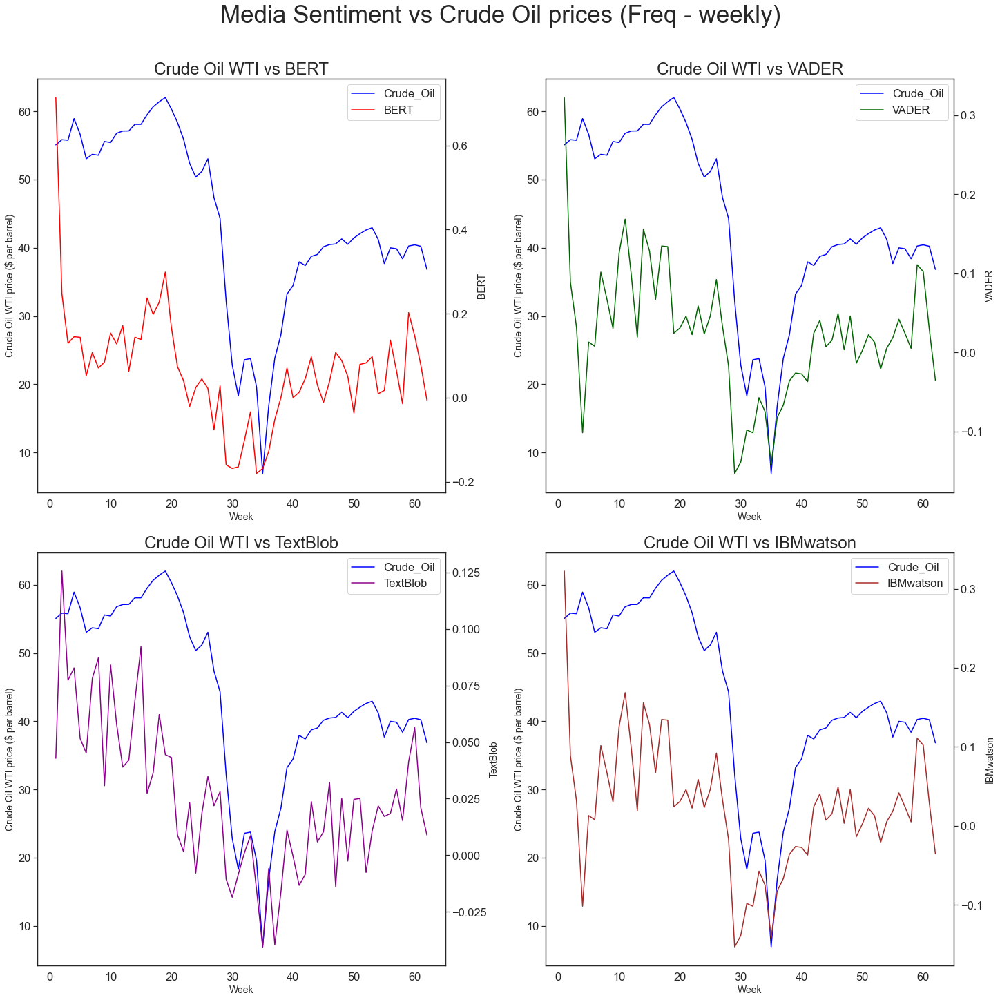

In [371]:
fig, axs = plt.subplots(nrows=req_rows, ncols=2, figsize = (20,20), constrained_layout = True)
i = 0
index = 0
while i < len(keylist):
    j=0
    while j < 2:
        sns.set_style('white')
        axs[index,j].plot(Plot_setW['Week'], Plot_setW['Crude_Oil'], color = "Blue", label = 'Crude_Oil')
        axs[index,j].set_xlabel('Week', size = 14)
        axs[index,j].set_ylabel('Crude Oil WTI price ($ per barrel)', size = 14)
        #axs[index,j].set_ylim(bottom = 25, top = 80)
        axs[index,j].set_title('Crude Oil WTI vs ' + keylist[i][:-6], size = 24)
        ax2 = axs[index,j].twinx()
        sns.set_style('white')
        ax2.plot(Plot_setW['Week'], Plot_setW[keylist[i]], color = colors_val[keylist[i]], label = keylist[i][:-6])
        ax2.set_ylabel(keylist[i][:-6], size = 14)
        #ax2.set_ylim(bottom = -1, top = 1)
        
        # For Legend
        ln_1, lab_1 = axs[index,j].get_legend_handles_labels()
        ln_2, lab_2 = ax2.get_legend_handles_labels()
        lns = ln_1 + ln_2
        labs = lab_1 + lab_2
        ax2.legend(lns, labs, loc=0)
        
        j = j + 1
        i = i + 1
        if (i == len(keylist)) & (j != 2):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Media Sentiment vs Crude Oil prices (Freq - weekly)\n', size = 35)
fig.savefig('Crude_oil_vs_mediasentiments_weekly.png')
plt.show()

### f) Calculating mutual information (MI) values

In [432]:
MI3 = mutual_info_regression(np.array(Plot_setW[keylist]), np.array(Plot_setW['Crude_Oil']))
MI3 = dict(zip(keylist, MI3))
MI3 = pd.DataFrame.from_dict(MI3, orient = 'index')
MI3.rename(columns = {0:'MI weekly actual'}, inplace = True)

In [433]:
MI3

,MI weekly actual
BERT_label,0.501348
VADER_label,0.482781
TextBlob_label,0.354188
IBMwatson_label,0.482781


### g) Crude oil Vs. average sentiment trends (Fitting polynomial regression) (Weekly)

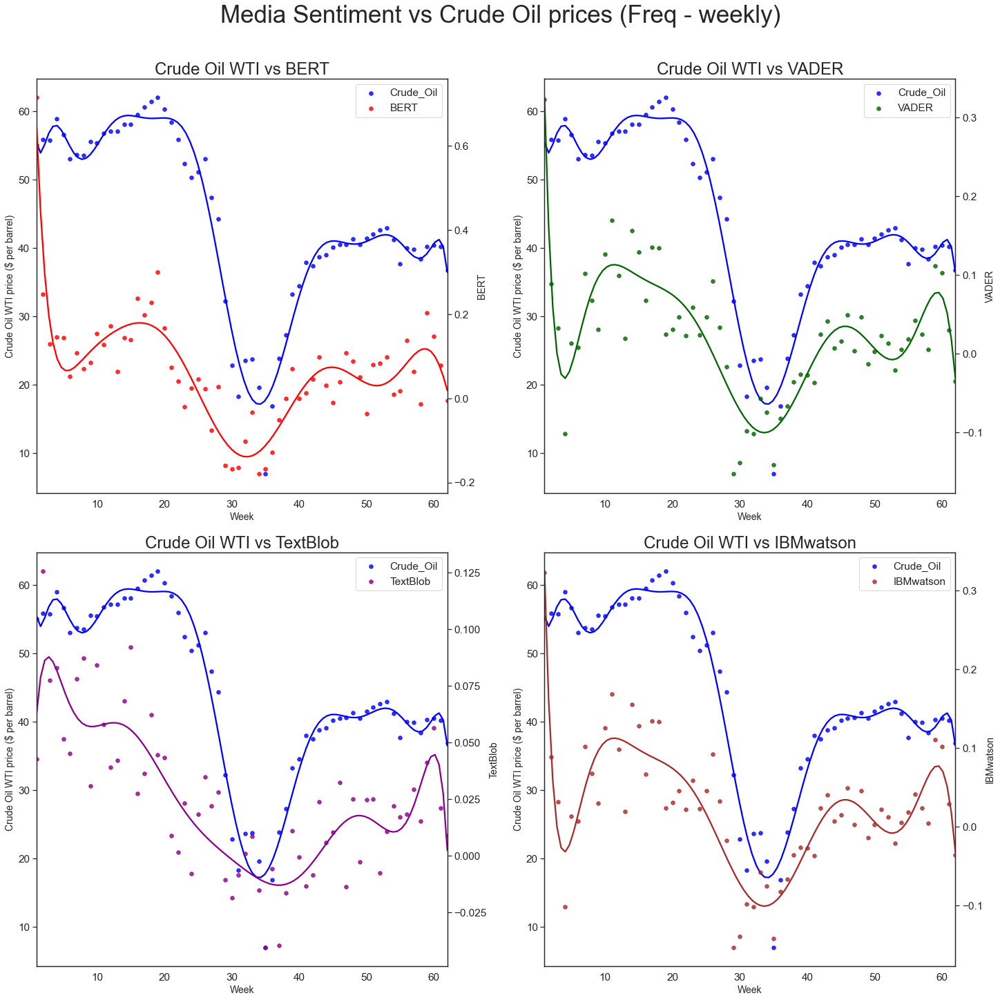

In [307]:
fig, axs = plt.subplots(nrows=req_rows, ncols=2, figsize = (20,20), constrained_layout = True)
SA_regvalsW = {}
i = 0
index = 0
while i < len(keylist):
    j=0
    while j < 2:
        sns.set_style('white')
        p1 = sns.regplot(x = Plot_setW['Week'], y = Plot_setW['Crude_Oil'], color = "Blue", ax = axs[index,j], 
                    scatter_kws={"s": 30}, order = 14, ci=None, label='Crude_Oil')
        axs[index,j].set_xlabel('Week', size = 14)
        axs[index,j].set_ylabel('Crude Oil WTI price ($ per barrel)', size = 14)
        axs[index,j].set_title('Crude Oil WTI vs ' + keylist[i][:-6], size = 24)
        
        if i == 0:
            crudeoil_regvalsW = p1.get_lines()[0].get_ydata()     # Retrieving the regressed crude oil values
        
        ax2 = axs[index,j].twinx()
        sns.set_style('white')
        p2 = sns.regplot(x = Plot_setW['Week'], y = Plot_setW[keylist[i]], color = colors_val[keylist[i]], ax = ax2,
                   scatter_kws={"s": 30}, order = 10, ci=None, label=keylist[i][:-6])
        ax2.set_ylabel(keylist[i][:-6], size = 14)
        
        SA_regvalsW[keylist[i]] = p2.get_lines()[0].get_ydata()    # Retrieving the regressed sentiment values
        
        # For Legend
        ln_1, lab_1 = axs[index,j].get_legend_handles_labels()
        ln_2, lab_2 = ax2.get_legend_handles_labels()
        lns = ln_1 + ln_2
        labs = lab_1 + lab_2
        ax2.legend(lns, labs, loc=0)
        
        j = j + 1
        i = i + 1
        if (i == len(keylist)) & (j != 2):
            axs[index,j].axis("off")
            break
    index = index + 1
plt.suptitle('Media Sentiment vs Crude Oil prices (Freq - weekly)\n', size = 35)
fig.savefig('Crude_oil_vs_mediasentiments_weekly_trendline.png')
plt.show()

### h) Calculating mutual information (MI) values

In [434]:
MI4 = mutual_info_regression(np.array(pd.DataFrame.from_dict(SA_regvalsW)), crudeoil_regvalsW)
MI4 = dict(zip(keylist, MI4))
MI4 = pd.DataFrame.from_dict(MI4, orient = 'index')
MI4.rename(columns = {0:'MI weekly regressed'}, inplace = True)

In [436]:
MI4

,MI weekly regressed
BERT_label,0.990601
VADER_label,1.058539
TextBlob_label,0.879916
IBMwatson_label,1.058539


### i) Generating correlation matrix (freq - daily)

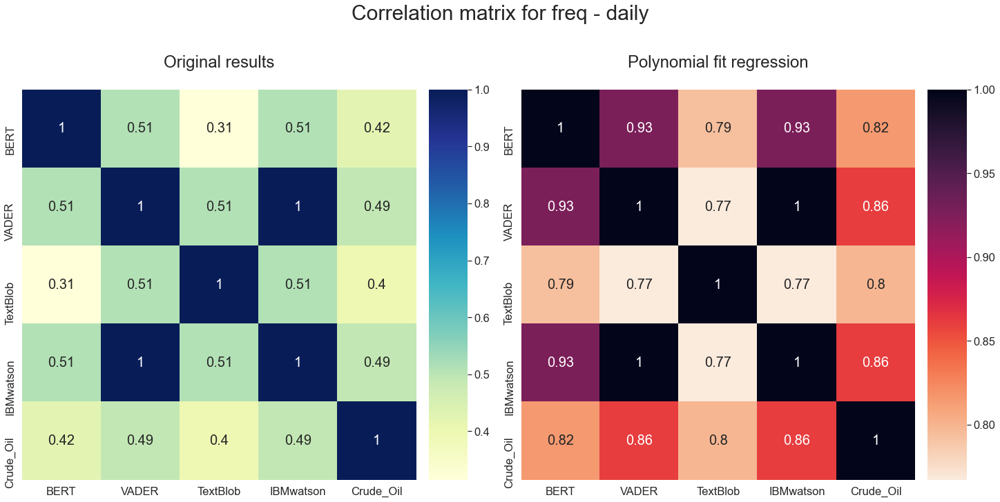

In [361]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize =(20, 10), constrained_layout = True)

Corrl_df = deepcopy(Plot_set[['BERT_label', 'VADER_label', 'TextBlob_label', 'IBMwatson_label', 'Crude_Oil']])
Corrl_df.rename(columns=dict(zip(list(Corrl_df.columns)[:-1], [k[:-6] for k in keylist])), inplace = True)
sns.heatmap(Corrl_df.corr(), annot=True, annot_kws={"size": 20}, cmap = 'YlGnBu', ax = ax1)
sns.set(font_scale=1.5)
ax1.set_title('Original results\n', size = 24)

Corrl_df = pd.DataFrame.from_dict(SA_regvals)
Corrl_df['Crude_Oil'] = crudeoil_regvals
Corrl_df.rename(columns=dict(zip(list(Corrl_df.columns)[:-1], [k[:-6] for k in keylist])), inplace = True)
sns.heatmap(Corrl_df.corr(), annot=True, annot_kws={"size": 20}, cmap = 'rocket_r', ax = ax2)
sns.set(font_scale=1.5)
ax2.set_title('Polynomial fit regression\n', size = 24)

plt.suptitle('Correlation matrix for freq - daily\n', size = 30)
fig.savefig('Crude_oil_vs_mediasentiments_corr_daily.png')
plt.show()

### j) Generating correlation matrix (freq - weekly)

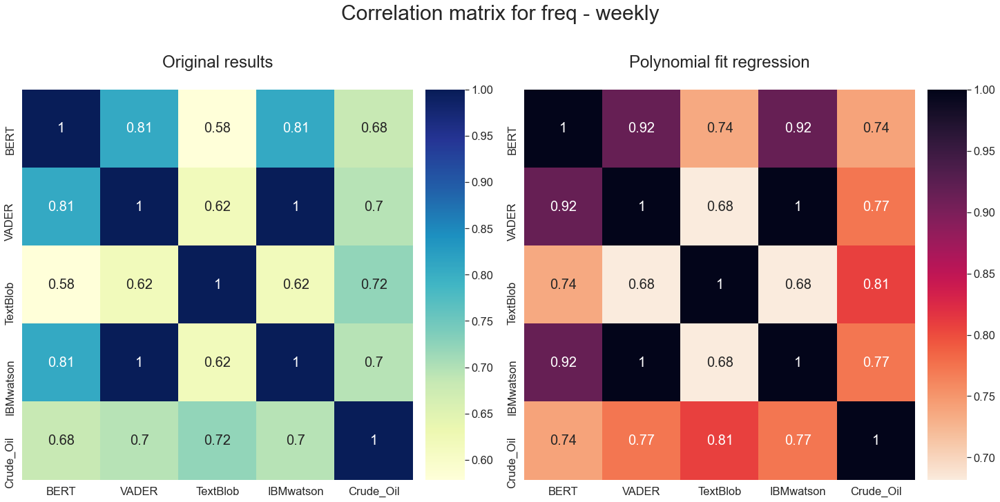

In [362]:
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize =(20, 10), constrained_layout = True)

Corrl_df = deepcopy(Plot_setW[['BERT_label', 'VADER_label', 'TextBlob_label', 'IBMwatson_label', 'Crude_Oil']])
Corrl_df.rename(columns=dict(zip(list(Corrl_df.columns)[:-1], [k[:-6] for k in keylist])), inplace = True)
sns.heatmap(Corrl_df.corr(), annot=True, annot_kws={"size": 20}, cmap = 'YlGnBu', ax = ax1)
sns.set(font_scale=1.5)
ax1.set_title('Original results\n', size = 24)

Corrl_df = pd.DataFrame.from_dict(SA_regvalsW)
Corrl_df['Crude_Oil'] = crudeoil_regvalsW
Corrl_df.rename(columns=dict(zip(list(Corrl_df.columns)[:-1], [k[:-6] for k in keylist])), inplace = True)
sns.heatmap(Corrl_df.corr(), annot=True, annot_kws={"size": 20}, cmap = 'rocket_r', ax = ax2)
sns.set(font_scale=1.5)
ax2.set_title('Polynomial fit regression\n', size = 24)

plt.suptitle('Correlation matrix for freq - weekly\n', size = 30)
fig.savefig('Crude_oil_vs_mediasentiments_corr_weekly.png')
plt.show()

### k) Generating the MI results dataframe

In [437]:
MI_results = pd.concat([MI1, MI2, MI3, MI4], axis = 1)

In [438]:
MI_results

,MI daily actual,MI daily regressed,MI weekly actual,MI weekly regressed
BERT_label,0.190096,1.192871,0.501348,0.990601
VADER_label,0.185157,1.262531,0.482781,1.058539
TextBlob_label,0.047880,1.083756,0.354188,0.879916
IBMwatson_label,0.185157,1.262531,0.482781,1.058539
